In [1]:
!gdown 1ZD2c2tuqeCq9JQZvIK-z_hvxCf1dvNrd
!unzip -q BCSS-WSSS.zip

Downloading...
From (original): https://drive.google.com/uc?id=1ZD2c2tuqeCq9JQZvIK-z_hvxCf1dvNrd
From (redirected): https://drive.google.com/uc?id=1ZD2c2tuqeCq9JQZvIK-z_hvxCf1dvNrd&confirm=t&uuid=22bcc8bd-be71-45da-bb34-100bfd892dfb
To: /kaggle/working/BCSS-WSSS.zip
100%|██████████████████████████████████████| 3.10G/3.10G [00:35<00:00, 88.0MB/s]


In [2]:
!pip install -q git+https://github.com/openai/CLIP.git

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 100.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the pack

In [3]:
import os
import torch
import clip
from typing import Dict, List
import torch.optim as optim
# =========================
#  Global config
# =========================
DATA_ROOT = "/kaggle/working/BCSS-WSSS"  # path bạn đưa
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
CLIP_MODEL_NAME = "ViT-B/16"  # hợp với patch 224x224

print("Using device:", DEVICE)

# =========================
#  Load CLIP (Stage 0.1)
# =========================
clip_model, clip_preprocess = clip.load(CLIP_MODEL_NAME, device=DEVICE)
clip_model.eval()  # inference mode

# =========================
#  Classes & prompts
# =========================
classes = ["Tumor", "Stroma", "Lymphocytic infiltrate", "Necrosis", "Background"]

class2prompts: Dict[str, List[str]] = {
    "Tumor": [
        "irregular glands","hyperchromatic nuclei","nuclear crowding","atypical epithelial cells",
        "pleomorphic tumor epithelium","high nuclear to cytoplasmic ratio","invasive epithelial nests",
        "mitotic figures","abnormal gland formation","dense tumor clusters"
    ],
    "Stroma": [
        "fibroblast connective tissue","collagen bundles","spindle-shaped fibroblasts",
        "eosinophilic fibrous matrix","myofibroblast stroma","dense desmoplastic tissue",
        "fibrotic connective region","reactive fibrous tissue","stromal hypercellularity","fibrous connective tissue"
    ],
    "Lymphocytic infiltrate": [
        "small round lymphocytes","dense lymphoid infiltrate","monomorphic small cells",
        "immune cell cluster","band-like lymphocytic infiltration","basophilic nuclei",
        "peritumoral lymphoid cells","chronic inflammatory infiltrate","lymphoid aggregate","round basophilic nuclei"
    ],
    "Necrosis": [
        "acellular eosinophilic debris","ghost cells without nuclei","coagulative necrosis region",
        "granular necrotic material","cellular remnants","pale anuclear area",
        "necrotic focus","amorphous eosinophilic debris","dead tissue region","acellular necrotic zone"
    ],
    "Background": [
        "blank slide region without tissue","white empty background area",
        "unstained glass slide region","non-tissue area outside the specimen"
    ],
}

print("Num classes:", len(classes))
for c in classes:
    print(f"  {c}: {len(class2prompts[c])} prompts")

Using device: cuda


100%|███████████████████████████████████████| 335M/335M [00:32<00:00, 10.8MiB/s]


Num classes: 5
  Tumor: 10 prompts
  Stroma: 10 prompts
  Lymphocytic infiltrate: 10 prompts
  Necrosis: 10 prompts
  Background: 4 prompts


In [4]:
import torch.nn.functional as F

# Where to save text prototypes (có thể đổi nếu muốn)
TEXT_PROTOTYPE_PATH = os.path.join(DATA_ROOT, "text_prototypes_clip.pt")

def build_text_prototypes(
    classes,
    class2prompts: Dict[str, List[str]],
    model,
    device: str = "cuda",
    prompt_prefix: str = "a histopathology image patch showing "
):
    """
    Stage 0.2:
      - Encode prompts -> CLIP text embeddings
      - Build per-prompt features & class-level prototype (mean)
    """
    per_prompt_text_features = {}
    class_text_prototypes = {}
    all_raw_prompts = {}

    with torch.no_grad():
        for cls in classes:
            prompts = class2prompts[cls]
            # Thêm prefix cho ngữ cảnh H&E rõ hơn
            full_texts = [prompt_prefix + p for p in prompts]

            # Tokenize & encode
            tokens = clip.tokenize(full_texts).to(device)
            text_features = model.encode_text(tokens)

            # L2 normalize theo channel (dim=-1)
            text_features = F.normalize(text_features, p=2, dim=-1)

            # Lưu per-prompt features
            per_prompt_text_features[cls] = text_features.cpu()  # đưa về CPU để tiết kiệm VRAM

            # Prototype = mean các prompt -> rồi normalize lại
            proto = text_features.mean(dim=0, keepdim=True)
            proto = F.normalize(proto, p=2, dim=-1)
            class_text_prototypes[cls] = proto.squeeze(0).cpu()

            all_raw_prompts[cls] = full_texts

    return {
        "classes": classes,
        "raw_prompts": all_raw_prompts,
        "per_prompt_text_features": per_prompt_text_features,
        "class_text_prototypes": class_text_prototypes,
    }

# Build & save
text_proto_bank = build_text_prototypes(
    classes=classes,
    class2prompts=class2prompts,
    model=clip_model,
    device=DEVICE,
)

os.makedirs(DATA_ROOT, exist_ok=True)
torch.save(text_proto_bank, TEXT_PROTOTYPE_PATH)

print("Saved text prototype bank to:", TEXT_PROTOTYPE_PATH)
for c in classes:
    feat = text_proto_bank["class_text_prototypes"][c]
    print(f"{c:24s} prototype dim = {feat.shape[0]}")

Saved text prototype bank to: /kaggle/working/BCSS-WSSS/text_prototypes_clip.pt
Tumor                    prototype dim = 512
Stroma                   prototype dim = 512
Lymphocytic infiltrate   prototype dim = 512
Necrosis                 prototype dim = 512
Background               prototype dim = 512


In [5]:
# ============================================================
# Stage 1.1 (FIXED) - Build VISUAL PROTOTYPE BANK (PBIP-style)
#  - Hỗ trợ cả format [abcd] và [0/1...], ví dụ: [1101]
#  - Scan training patches
#  - Parse patch-level labels từ filename
#  - Extract CLIP image features (dùng clip_model đã load ở Stage 0.1)
#  - Cluster per class -> visual prototypes
#  - Save: /kaggle/working/BCSS-WSSS/visual_prototypes_clip.pt
# ============================================================

import os
import re
from typing import Dict, List
from collections import defaultdict

import torch
import torch.nn.functional as F
import numpy as np
from PIL import Image
from tqdm import tqdm
from sklearn.cluster import MiniBatchKMeans

# ----------------------------
# Basic config
# ----------------------------
DATA_ROOT = "/kaggle/working/BCSS-WSSS"
TRAIN_DIR = os.path.join(DATA_ROOT, "training")
VISUAL_PROTO_PATH = os.path.join(DATA_ROOT, "visual_prototypes_clip.pt")

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

N_PROTOTYPES_PER_CLASS = 16
BATCH_SIZE = 64

# mapping cho 2 kiểu:
# 1) letters [abcd]
letter2class = {
    "a": "Tumor",
    "b": "Stroma",
    "c": "Lymphocytic infiltrate",
    "d": "Necrosis",
}
# 2) binary [0/1...] với thứ tự [Tumor, Stroma, Lymphocytic infiltrate, Necrosis]
pos2class = [
    "Tumor",
    "Stroma",
    "Lymphocytic infiltrate",
    "Necrosis",
]

classes = ["Tumor", "Stroma", "Lymphocytic infiltrate", "Necrosis", "Background"]

# ----------------------------
# Check clip_model & clip_preprocess
# ----------------------------
if "clip_model" not in globals() or "clip_preprocess" not in globals():
    raise RuntimeError(
        "clip_model / clip_preprocess not found in globals(). "
        "Hãy chắc chắn bạn đã chạy cell Stage 0.1 trước."
    )

clip_model.eval()
clip_model.to(DEVICE)

# ----------------------------
# Utils
# ----------------------------
def parse_labels_from_filename(fname: str) -> List[str]:
    """
    Parse các nhãn từ filename.

    Hỗ trợ 2 pattern:
    - ...[abcd].png  -> dùng letter2class
    - ...[0/1...].png với length 4 -> dùng pos2class:
        index 0 -> Tumor
        index 1 -> Stroma
        index 2 -> Lymphocytic infiltrate
        index 3 -> Necrosis
    """
    base = os.path.basename(fname)
    m = re.search(r"\[([0-9a-zA-Z]+)\]\.png$", base)
    if m is None:
        return []

    token = m.group(1)

    # Case 1: tất cả ký tự là a-d
    if all(ch in letter2class for ch in token):
        cls_list = [letter2class[ch] for ch in token]
        return list(dict.fromkeys(cls_list))  # remove dup, giữ thứ tự

    # Case 2: token là chuỗi 0/1 độ dài 4
    if len(token) == 4 and all(ch in "01" for ch in token):
        cls_list = []
        for i, ch in enumerate(token):
            if ch == "1" and i < len(pos2class):
                cls_list.append(pos2class[i])
        return cls_list

    # Nếu không rơi vào 2 case trên, coi như không parse được
    return []


def list_training_images(train_dir: str) -> List[str]:
    exts = (".png", ".jpg", ".jpeg", ".tif", ".tiff")
    img_paths = []
    for root, _, files in os.walk(train_dir):
        for f in files:
            if f.lower().endswith(exts):
                img_paths.append(os.path.join(root, f))
    img_paths.sort()
    return img_paths


# ----------------------------
# 1) Quét file training & parse label
# ----------------------------
all_img_paths = list_training_images(TRAIN_DIR)
print(f"Found {len(all_img_paths)} training images in {TRAIN_DIR}")

img_labels: List[List[str]] = []
for p in all_img_paths:
    cls_list = parse_labels_from_filename(p)
    img_labels.append(cls_list)

# Sanity check: đếm số ảnh per class
class_img_count = defaultdict(int)
for cls_list in img_labels:
    for c in cls_list:
        class_img_count[c] += 1

print("Training image counts per class (multi-label counts):")
for c in classes:
    if c == "Background":
        continue
    print(f"  {c:24s}: {class_img_count.get(c, 0)}")

# In thử vài file đầu tiên có nhãn để bạn dễ kiểm tra
print("\nSample parsed labels:")
shown = 0
for path, lbls in zip(all_img_paths, img_labels):
    if lbls:
        print(" ", os.path.basename(path), "->", lbls)
        shown += 1
        if shown >= 5:
            break

# ----------------------------
# 2) Extract CLIP features & gom theo class (multi-label)
# ----------------------------
features_per_class: Dict[str, List[torch.Tensor]] = {c: [] for c in classes if c != "Background"}

clip_model.eval()
with torch.no_grad():
    for i in tqdm(range(0, len(all_img_paths), BATCH_SIZE), desc="Extracting CLIP features"):
        batch_paths = all_img_paths[i : i + BATCH_SIZE]
        batch_labels = img_labels[i : i + BATCH_SIZE]

        images = []
        valid_idx = []
        for j, (path, lbls) in enumerate(zip(batch_paths, batch_labels)):
            try:
                img = Image.open(path).convert("RGB")
            except Exception as e:
                print(f"[WARN] Cannot open image {path}: {e}")
                continue
            images.append(clip_preprocess(img))
            valid_idx.append(j)

        if not images:
            continue

        images_tensor = torch.stack(images).to(DEVICE)
        image_features = clip_model.encode_image(images_tensor)
        image_features = F.normalize(image_features, p=2, dim=-1)

        for j, idx_in_batch in enumerate(valid_idx):
            lbls = batch_labels[idx_in_batch]

            c = lbls[0]
            feat = image_features[j].detach().cpu()
            features_per_class[c].append(feat)


# list -> tensor
for c in features_per_class:
    if len(features_per_class[c]) > 0:
        features_per_class[c] = torch.stack(features_per_class[c], dim=0)
    else:
        features_per_class[c] = torch.empty(0, clip_model.visual.output_dim)

print("\nPer-class feature shapes:")
for c in features_per_class:
    print(f"  {c:24s}: {tuple(features_per_class[c].shape)}")
print("\nSingle-label image counts:")
for c in features_per_class:
    print(f"  {c:24s}: {features_per_class[c].shape[0]}")

# ----------------------------
# 3) MiniBatchKMeans -> visual prototypes
# ----------------------------
visual_prototypes = {}
prototype_meta = {}

for c, feats in features_per_class.items():
    if feats.shape[0] == 0:
        print(f"[WARN] No features for class {c}, skipping prototype generation.")
        continue

    n_clusters = min(N_PROTOTYPES_PER_CLASS, feats.shape[0])
    print(f"\nRunning MiniBatchKMeans for class '{c}' with {feats.shape[0]} samples, "
          f"{n_clusters} clusters...")

    X = feats.numpy().astype(np.float32)

    kmeans = MiniBatchKMeans(
        n_clusters=n_clusters,
        batch_size=1024,
        max_iter=100,
        random_state=42,
        verbose=0,
    )
    kmeans.fit(X)

    centers = kmeans.cluster_centers_
    centers = torch.from_numpy(centers)
    centers = F.normalize(centers, p=2, dim=-1)

    visual_prototypes[c] = centers
    prototype_meta[c] = {
        "n_samples": int(feats.shape[0]),
        "n_clusters": int(n_clusters),
    }

print("\nVisual prototype shapes:")
for c, proto in visual_prototypes.items():
    print(f"  {c:24s}: {tuple(proto.shape)} (n_samples={prototype_meta[c]['n_samples']})")

# ----------------------------
# 4) Save
# ----------------------------
os.makedirs(DATA_ROOT, exist_ok=True)
save_dict = {
    "classes": [c for c in classes if c != "Background"],
    "visual_prototypes": visual_prototypes,
    "features_per_class_counts": {
        c: int(features_per_class[c].shape[0]) for c in features_per_class
    },
    "metadata": {
        "model_name": globals().get("CLIP_MODEL_NAME", "unknown"),
        "n_prototypes_per_class_target": N_PROTOTYPES_PER_CLASS,
        "prototype_meta": prototype_meta,
    },
}

torch.save(save_dict, VISUAL_PROTO_PATH)
print(f"\n[OK] Saved visual prototype bank to: {VISUAL_PROTO_PATH}")


Found 23422 training images in /kaggle/working/BCSS-WSSS/training
Training image counts per class (multi-label counts):
  Tumor                   : 15232
  Stroma                  : 16254
  Lymphocytic infiltrate  : 5598
  Necrosis                : 2884

Sample parsed labels:
  TCGA-A1-A0SK-DX1_xmin45749_ymin25055_MPP-0.2500+0[1101].png -> ['Tumor', 'Stroma', 'Necrosis']
  TCGA-A1-A0SK-DX1_xmin45749_ymin25055_MPP-0.2500+100[1100].png -> ['Tumor', 'Stroma']
  TCGA-A1-A0SK-DX1_xmin45749_ymin25055_MPP-0.2500+101[1100].png -> ['Tumor', 'Stroma']
  TCGA-A1-A0SK-DX1_xmin45749_ymin25055_MPP-0.2500+102[1100].png -> ['Tumor', 'Stroma']
  TCGA-A1-A0SK-DX1_xmin45749_ymin25055_MPP-0.2500+103[1100].png -> ['Tumor', 'Stroma']


Extracting CLIP features: 100%|██████████| 366/366 [02:22<00:00,  2.57it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



Per-class feature shapes:
  Tumor                   : (15232, 512)
  Stroma                  : (6448, 512)
  Lymphocytic infiltrate  : (684, 512)
  Necrosis                : (1058, 512)

Single-label image counts:
  Tumor                   : 15232
  Stroma                  : 6448
  Lymphocytic infiltrate  : 684
  Necrosis                : 1058

Running MiniBatchKMeans for class 'Tumor' with 15232 samples, 16 clusters...

Running MiniBatchKMeans for class 'Stroma' with 6448 samples, 16 clusters...


/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



Running MiniBatchKMeans for class 'Lymphocytic infiltrate' with 684 samples, 16 clusters...

Running MiniBatchKMeans for class 'Necrosis' with 1058 samples, 16 clusters...

Visual prototype shapes:
  Tumor                   : (16, 512) (n_samples=15232)
  Stroma                  : (16, 512) (n_samples=6448)
  Lymphocytic infiltrate  : (16, 512) (n_samples=684)
  Necrosis                : (16, 512) (n_samples=1058)


/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



[OK] Saved visual prototype bank to: /kaggle/working/BCSS-WSSS/visual_prototypes_clip.pt


In [6]:
# ============================================================
# Stage 1.2 - Two-Stage Extra Optimization
# ============================================================

import os, re
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from tqdm import tqdm

# ----------------------------
# Config
# ----------------------------
DATA_ROOT = "/kaggle/working/BCSS-WSSS"
TRAIN_DIR = os.path.join(DATA_ROOT, "training")
TEXT_PROTO_PATH = os.path.join(DATA_ROOT, "text_prototypes_clip.pt")
VISUAL_PROTO_PATH = os.path.join(DATA_ROOT, "visual_prototypes_clip.pt")
LEARNED_VISION_PROTO_PATH = os.path.join(DATA_ROOT, "vision_prototypes_learned.pt")
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

BATCH_SIZE = 64
NUM_EPOCHS_STAGE1 = 100
NUM_EPOCHS_STAGE2 = 100

LR_STAGE1 = 0.02
LR_STAGE2 = 0.01

# Loss weights
LAMBDA_VIS_STAGE1 = 0.01
LAMBDA_MARGIN_STAGE1 = 2.0

LAMBDA_TEXT_STAGE2 = 1.0
LAMBDA_VIS_STAGE2 = 0.005
LAMBDA_MARGIN_STAGE2 = 0.5

MARGIN = 0.2

classes_no_bg = ["Tumor", "Stroma", "Lymphocytic infiltrate", "Necrosis"]

# ----------------------------
# Setup CLIP
# ----------------------------
if "clip_model" not in globals(): raise RuntimeError("Run Stage 0.1 first.")
clip_model.eval().to(DEVICE).float()
for p in clip_model.parameters(): p.requires_grad = False
print("CLIP Frozen.")

# ----------------------------
# Load prototypes
# ----------------------------
text_proto_bank = torch.load(TEXT_PROTO_PATH)
visual_proto_bank = torch.load(VISUAL_PROTO_PATH)

text_protos = torch.stack([
    text_proto_bank["class_text_prototypes"][c].float() for c in classes_no_bg
], dim=0)
text_protos = F.normalize(text_protos, p=2, dim=-1).to(DEVICE)
feat_dim = text_protos.shape[-1]

# ----------------------------
# Image list + label parser
# ----------------------------
def parse_labels(fname):
    base = os.path.basename(fname)
    m = re.search(r"\[([0-9a-zA-Z]+)\]\.png$", base)
    if not m: return []
    token = m.group(1)
    l2c = {"a": "Tumor", "b": "Stroma", "c": "Lymphocytic infiltrate", "d": "Necrosis"}
    if all(c in l2c for c in token): return list(dict.fromkeys([l2c[c] for c in token]))
    p2c = ["Tumor", "Stroma", "Lymphocytic infiltrate", "Necrosis"]
    if len(token) == 4 and all(c in "01" for c in token): return [p2c[i] for i, c in enumerate(token) if c == "1"]
    return []

def list_images(d):
    paths = []
    for r, _, fs in os.walk(d):
        for f in fs:
            if f.lower().endswith((".png", ".jpg")): paths.append(os.path.join(r, f))
    return sorted(paths)

if "train_img_paths" not in globals():
    train_img_paths = list_images(TRAIN_DIR)
    train_labels = [parse_labels(p) for p in train_img_paths]

valid_indices = [i for i, l in enumerate(train_labels) if any(c in classes_no_bg for c in l)]

# ----------------------------
# Vision Prototype Learner
# ----------------------------
class VisionPrototypeLearner(nn.Module):
    def __init__(self, vis_dict, txt_mat, classes):
        super().__init__()
        self.classes = classes
        self.vision_protos = nn.ParameterDict()
        self.orig_visual_protos = {}
        for c in classes:
            V_c = vis_dict[c].float()
            self.vision_protos[c] = nn.Parameter(V_c.clone())
            self.orig_visual_protos[c] = V_c.clone()
        self.register_buffer("text_protos", txt_mat.clone())

    def get_data(self, c, device):
        return (self.vision_protos[c].to(device),
                self.orig_visual_protos[c].to(device),
                self.text_protos[self.classes.index(c)].to(device))

    def get_all(self, device):
        ps, idxs = [], []
        for i, c in enumerate(self.classes):
            p = self.vision_protos[c].to(device)
            ps.append(p)
            idxs.append(torch.full((p.size(0),), i, dtype=torch.long, device=device))
        return torch.cat(ps), torch.cat(idxs)

vpl_model = VisionPrototypeLearner(visual_proto_bank["visual_prototypes"], text_protos, classes_no_bg).to(DEVICE)

# ----------------------------
# Training loop helper
# ----------------------------
def train_stage(num_epochs, lambda_text, lambda_vis, lambda_margin, lr, stage_name):
    optimizer = optim.Adam(vpl_model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    print(f"\n=== {stage_name}: {num_epochs} epochs ===")
    for epoch in range(1, num_epochs + 1):
        vpl_model.train()
        optimizer.zero_grad()

        # 1. Text alignment
        l_txt = 0.0
        count = 0
        for c in classes_no_bg:
            P, V, T = vpl_model.get_data(c, DEVICE)
            if P.shape[0] == 0: continue
            sim_txt = (F.normalize(P, p=2, dim=-1) * F.normalize(T, p=2, dim=-1).unsqueeze(0)).sum(-1)
            l_txt += torch.mean(1.0 - sim_txt)
            count += 1
        if count > 0: l_txt /= count

        # 2. Visual regularization
        l_vis = 0.0
        for c in classes_no_bg:
            P, V, _ = vpl_model.get_data(c, DEVICE)
            if P.shape[0] == 0: continue
            l_vis += F.mse_loss(P, V)
        if count > 0: l_vis /= count

        # 3. Margin loss
        P_all, idxs = vpl_model.get_all(DEVICE)
        P_n = F.normalize(P_all, p=2, dim=-1)
        sim_mat = P_n @ P_n.t()
        mask_diff = idxs[:, None] != idxs[None, :]
        l_mar = (F.relu(sim_mat - MARGIN) * mask_diff).sum() / (mask_diff.sum() + 1e-6)

        # Total loss
        loss = lambda_text * l_txt + lambda_vis * l_vis + lambda_margin * l_mar

        loss.backward()
        optimizer.step()
        scheduler.step()

        if epoch % 20 == 0 or epoch == 1:
            print(f"[{stage_name} Ep {epoch}] Loss: {loss.item():.4f} | Text: {l_txt.item():.4f} | "
                  f"Vis: {l_vis.item():.4f} | Margin: {l_mar.item():.4f} | LR: {scheduler.get_last_lr()[0]:.5f}")
# ----------------------------
# Stage 2: Text Alignment Fine-tune (Fixed)
# ----------------------------
def train_stage2_improved(num_epochs, lambda_text, lambda_vis, lambda_margin, lr, stage_name, temp=0.05):
    optimizer = optim.Adam(vpl_model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    print(f"\n=== {stage_name}: {num_epochs} epochs ===")
    for epoch in range(1, num_epochs + 1):
        vpl_model.train()
        optimizer.zero_grad()

        # --------------------
        # 1. Hard Prompt / Weighted Text Alignment
        # --------------------
        l_txt = 0.0
        count = 0
        for c in classes_no_bg:
            P, V, T_all = vpl_model.get_data(c, DEVICE)  # P: [num_proto, dim], T_all: [num_prompt, dim]
            if P.shape[0] == 0: continue

            # Ensure 2D
            if P.dim() == 1: P = P.unsqueeze(0)
            if T_all.dim() == 1: T_all = T_all.unsqueeze(0)

            # Normalize
            P_n = F.normalize(P, p=2, dim=-1)
            T_n = F.normalize(T_all, p=2, dim=-1)

            # Cosine similarity scaled by temperature
            sim = P_n @ T_n.t() / temp  # [num_proto, num_prompt]

            # Hard prompt mining: take prompts with similarity < max per prototype
            sim_max, _ = sim.max(dim=1, keepdim=True)
            hard_mask = sim < sim_max
            sim_hard = sim * hard_mask.float()

            # Compute loss per prototype
            denom = hard_mask.sum(dim=1).clamp(min=1)  # avoid div by 0
            loss_proto = (1.0 - sim_hard).sum(dim=1) / denom
            l_txt += loss_proto.mean()
            count += 1
        if count > 0: l_txt /= count

        # --------------------
        # 2. Visual regularization
        # --------------------
        l_vis = 0.0
        for c in classes_no_bg:
            P, V, _ = vpl_model.get_data(c, DEVICE)
            if P.shape[0] == 0: continue
            l_vis += F.mse_loss(P, V)
        if count > 0: l_vis /= count

        # --------------------
        # 3. Hard Negative Margin
        # --------------------
        P_all, idxs = vpl_model.get_all(DEVICE)
        P_n_all = F.normalize(P_all, p=2, dim=-1)
        sim_mat = P_n_all @ P_n_all.t()
        mask_diff = idxs[:, None] != idxs[None, :]
        hard_mask_margin = (sim_mat > MARGIN) * mask_diff
        l_mar = (F.relu(sim_mat - MARGIN) * hard_mask_margin).sum() / (hard_mask_margin.sum() + 1e-6)

        # --------------------
        # Total loss
        # --------------------
        loss = lambda_text * l_txt + lambda_vis * l_vis + lambda_margin * l_mar
        loss.backward()
        optimizer.step()
        scheduler.step()

        if epoch % 20 == 0 or epoch == 1:
            print(f"[{stage_name} Ep {epoch}] Loss: {loss.item():.4f} | Text: {l_txt.item():.4f} | "
                  f"Vis: {l_vis.item():.4f} | Margin: {l_mar.item():.4f} | LR: {scheduler.get_last_lr()[0]:.5f}")

# ----------------------------
# Stage 1: Margin + Visual
# ----------------------------
train_stage(NUM_EPOCHS_STAGE1, lambda_text=0.0, lambda_vis=LAMBDA_VIS_STAGE1,
            lambda_margin=LAMBDA_MARGIN_STAGE1, lr=LR_STAGE1, stage_name="Stage1-Stability")

# ----------------------------
# Stage 2: Text Alignment Fine-tune
# ----------------------------
train_stage2_improved(
    num_epochs=100,
    lambda_text=1.0,
    lambda_vis=0.005,
    lambda_margin=0.5,
    lr=0.01,
    stage_name="Stage2-TextAlign-Improved",
    temp=0.05
)
# ----------------------------
# Save optimized prototypes
# ----------------------------
out = {}
for c in classes_no_bg:
    out[c] = F.normalize(vpl_model.vision_protos[c].detach().cpu().float(), p=2, dim=-1)

torch.save({
    "classes": classes_no_bg, 
    "vision_prototypes_learned": out, 
    "feat_dim": feat_dim,
    "config": {"strategy": "TwoStage_ExtraOpt"}
}, LEARNED_VISION_PROTO_PATH)

print(f"\n[OK] Saved Two-Stage optimized prototypes to: {LEARNED_VISION_PROTO_PATH}")


CLIP Frozen.

=== Stage1-Stability: 100 epochs ===
[Stage1-Stability Ep 1] Loss: 1.5277 | Text: 0.6663 | Vis: 0.0000 | Margin: 0.7639 | LR: 0.02000
[Stage1-Stability Ep 20] Loss: 0.0007 | Text: 1.0058 | Vis: 0.0286 | Margin: 0.0002 | LR: 0.01809
[Stage1-Stability Ep 40] Loss: 0.0004 | Text: 1.0182 | Vis: 0.0369 | Margin: 0.0000 | LR: 0.01309
[Stage1-Stability Ep 60] Loss: 0.0004 | Text: 1.0193 | Vis: 0.0377 | Margin: 0.0000 | LR: 0.00691
[Stage1-Stability Ep 80] Loss: 0.0004 | Text: 1.0194 | Vis: 0.0378 | Margin: 0.0000 | LR: 0.00191
[Stage1-Stability Ep 100] Loss: 0.0004 | Text: 1.0194 | Vis: 0.0378 | Margin: 0.0000 | LR: 0.00000

=== Stage2-TextAlign-Improved: 100 epochs ===
[Stage2-TextAlign-Improved Ep 1] Loss: 1.0002 | Text: 1.0000 | Vis: 0.0378 | Margin: 0.0000 | LR: 0.01000
[Stage2-TextAlign-Improved Ep 20] Loss: 1.0059 | Text: 1.0000 | Vis: 0.0046 | Margin: 0.0117 | LR: 0.00905
[Stage2-TextAlign-Improved Ep 40] Loss: 1.0000 | Text: 1.0000 | Vis: 0.0071 | Margin: 0.0000 | LR: 0.

In [7]:
# ============================================================
# Stage 1.3 - Hybrid Prototypes (VLHP-style, offline init)
#
# Mục tiêu:
#   - Xây hybrid prototypes H_c,m,k từ:
#       P_c,m : vision prototypes đã học (Stage 1.2)
#       T_c,k : text prompt prototypes (Stage 0.2, per_prompt_text_features)
#
#   - Ở đây mình dùng f(P,T) = normalize((P + T)/2)
#     (tương đương 1 MLP tuyến tính với weight [I/2, I/2], bias=0).
#
# Output:
#   - /kaggle/working/BCSS-WSSS/hybrid_prototypes.pt
#     {
#       "classes": [...],
#       "hybrid_prototypes": { class_name: tensor [K_v, K_t, D] },
#       "feat_dim": D,
#       "metadata": {
#           class_name: {"num_vision": K_v, "num_text_prompts": K_t}
#       }
#     }
#
#   Trong Stage 2, bạn có thể:
#     - flatten [K_v, K_t, D] -> [K_v*K_t, D] để dùng như tập prompt tokens
#     - hoặc reduce trên axis k hoặc m tùy thiết kế.
# ============================================================

import os
from typing import Dict

import torch
import torch.nn.functional as F

DATA_ROOT = "/kaggle/working/BCSS-WSSS"
TEXT_PROTO_PATH = os.path.join(DATA_ROOT, "text_prototypes_clip.pt")
VISION_PROTO_PATH = os.path.join(DATA_ROOT, "vision_prototypes_learned.pt")
HYBRID_PROTO_PATH = os.path.join(DATA_ROOT, "hybrid_prototypes.pt")

if not os.path.exists(TEXT_PROTO_PATH):
    raise FileNotFoundError(f"Text prototype file not found at {TEXT_PROTO_PATH}")
if not os.path.exists(VISION_PROTO_PATH):
    raise FileNotFoundError(f"Learned vision prototypes file not found at {VISION_PROTO_PATH}")

# ------------------------------------------------------------
# Load prototype banks
# ------------------------------------------------------------
text_proto_bank = torch.load(TEXT_PROTO_PATH)
vision_proto_bank = torch.load(VISION_PROTO_PATH)

# Từ Stage 0.2
per_prompt_text_features: Dict[str, torch.Tensor] = text_proto_bank["per_prompt_text_features"]
class_text_prototypes: Dict[str, torch.Tensor] = text_proto_bank["class_text_prototypes"]

# Từ Stage 1.2
vision_prototypes_learned: Dict[str, torch.Tensor] = vision_proto_bank["vision_prototypes_learned"]
classes = vision_proto_bank["classes"]          # ["Tumor", "Stroma", "Lymphocytic infiltrate", "Necrosis"]
feat_dim = vision_proto_bank["feat_dim"]        # nên là 512 cho CLIP ViT-B/16

print("Classes in vision prototype bank:", classes)
print("Feature dim:", feat_dim)

# ------------------------------------------------------------
# Build hybrid prototypes H_c,m,k = normalize((P_c,m + T_c,k) / 2)
# ------------------------------------------------------------
hybrid_prototypes: Dict[str, torch.Tensor] = {}
metadata = {}

for c in classes:
    if c not in vision_prototypes_learned:
        raise KeyError(f"Class '{c}' not found in learned vision prototypes.")
    if c not in per_prompt_text_features:
        raise KeyError(f"Class '{c}' not found in per_prompt_text_features.")

    P_c = vision_prototypes_learned[c].float()          # [K_v, D]
    T_c_prompts = per_prompt_text_features[c].float()   # [K_t, D]

    if P_c.ndim != 2:
        raise ValueError(f"Vision prototypes for {c} must be 2D, got {P_c.shape}")
    if T_c_prompts.ndim != 2:
        raise ValueError(f"Text prompt features for {c} must be 2D, got {T_c_prompts.shape}")
    if P_c.shape[1] != T_c_prompts.shape[1]:
        raise ValueError(f"Dim mismatch for class {c}: "
                         f"P dim {P_c.shape[1]}, T dim {T_c_prompts.shape[1]}")

    K_v, D = P_c.shape
    K_t, _ = T_c_prompts.shape

    # broadcast: [K_v,1,D] + [1,K_t,D] -> [K_v,K_t,D]
    P_exp = P_c.unsqueeze(1).expand(K_v, K_t, D)
    T_exp = T_c_prompts.unsqueeze(0).expand(K_v, K_t, D)

    H = (P_exp + T_exp) * 0.5
    H = F.normalize(H, p=2, dim=-1)  # [K_v,K_t,D]

    hybrid_prototypes[c] = H.cpu()
    metadata[c] = {
        "num_vision": int(K_v),
        "num_text_prompts": int(K_t),
    }

    print(f"Class '{c}': vision prototypes = {K_v}, text prompts = {K_t}, hybrid shape = {tuple(H.shape)}")

# ------------------------------------------------------------
# Save hybrid prototype bank
# ------------------------------------------------------------
save_dict = {
    "classes": classes,
    "hybrid_prototypes": hybrid_prototypes,  # dict[class] -> [K_v, K_t, D]
    "feat_dim": int(feat_dim),
    "metadata": metadata,
    "notes": (
        "H_c,m,k = normalize((P_c,m + T_c,k)/2). "
        "You can flatten to [K_v*K_t, D] or further learn hybrid MLP in Stage 2."
    ),
}

torch.save(save_dict, HYBRID_PROTO_PATH)
print(f"\n[OK] Saved hybrid prototypes to: {HYBRID_PROTO_PATH}")


Classes in vision prototype bank: ['Tumor', 'Stroma', 'Lymphocytic infiltrate', 'Necrosis']
Feature dim: 512
Class 'Tumor': vision prototypes = 16, text prompts = 10, hybrid shape = (16, 10, 512)
Class 'Stroma': vision prototypes = 16, text prompts = 10, hybrid shape = (16, 10, 512)
Class 'Lymphocytic infiltrate': vision prototypes = 16, text prompts = 10, hybrid shape = (16, 10, 512)
Class 'Necrosis': vision prototypes = 16, text prompts = 10, hybrid shape = (16, 10, 512)

[OK] Saved hybrid prototypes to: /kaggle/working/BCSS-WSSS/hybrid_prototypes.pt


CLIP Input Dim: 768
Data Split: Train=18738 | Val=4684


Epoch 1/5: 100%|██████████| 586/586 [05:16<00:00,  1.85it/s, loss=0.305]



[Epoch 1] Train Loss: 0.3668 (Cls: 0.344 | Proto: 0.023)
Validating...
----------------------------------------
MEAN ACC: 88.39%
  >> Tumor                    : 88.49%
  >> Stroma                   : 82.73%
  >> Lymphocytic infiltrate   : 88.39%
  >> Necrosis                 : 93.94%
----------------------------------------

[Visual Check Epoch 1] Generating CAMs...


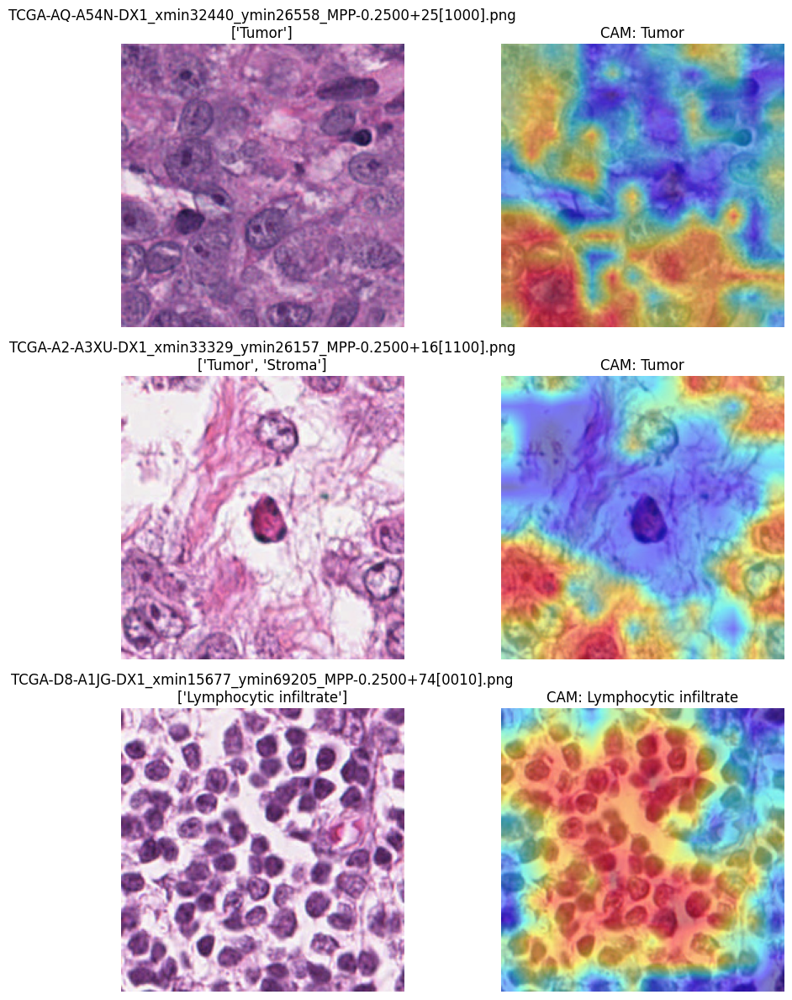

Epoch 2/5: 100%|██████████| 586/586 [05:17<00:00,  1.85it/s, loss=0.497]



[Epoch 2] Train Loss: 0.2726 (Cls: 0.260 | Proto: 0.013)
Validating...
----------------------------------------
MEAN ACC: 88.98%
  >> Tumor                    : 88.83%
  >> Stroma                   : 83.60%
  >> Lymphocytic infiltrate   : 89.56%
  >> Necrosis                 : 93.92%
----------------------------------------

[Visual Check Epoch 2] Generating CAMs...


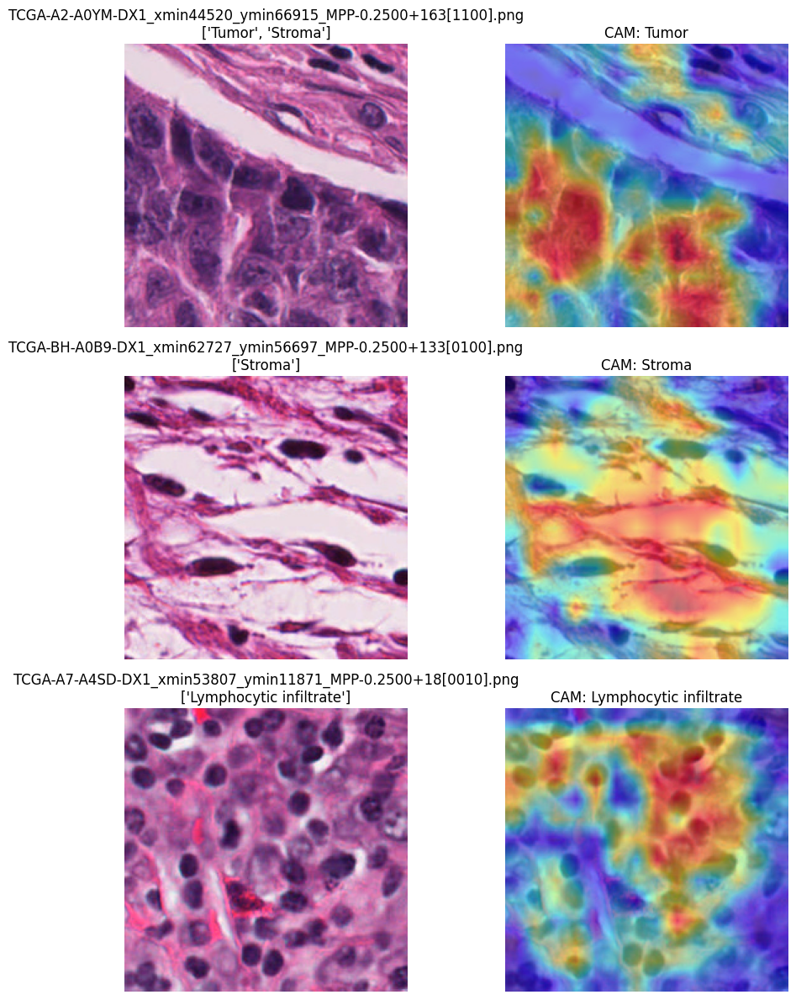

Epoch 3/5: 100%|██████████| 586/586 [05:18<00:00,  1.84it/s, loss=0.198]



[Epoch 3] Train Loss: 0.2393 (Cls: 0.224 | Proto: 0.015)
Validating...
----------------------------------------
MEAN ACC: 89.20%
  >> Tumor                    : 89.05%
  >> Stroma                   : 83.75%
  >> Lymphocytic infiltrate   : 89.54%
  >> Necrosis                 : 94.47%
----------------------------------------

[Visual Check Epoch 3] Generating CAMs...


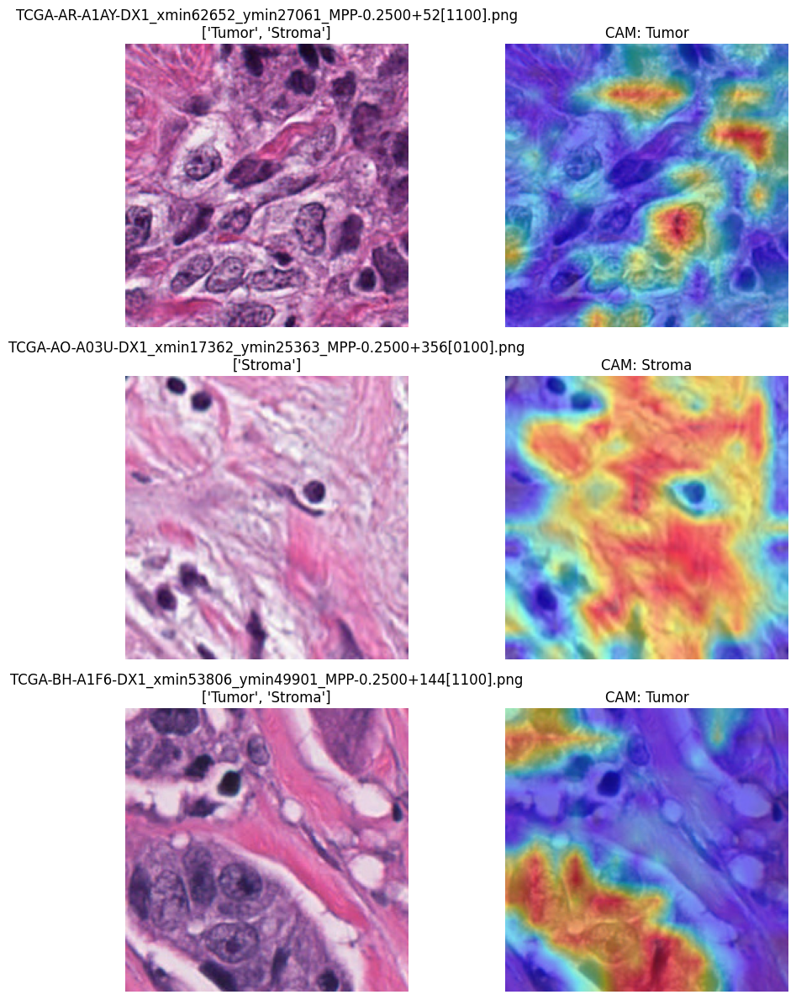

Epoch 4/5: 100%|██████████| 586/586 [05:19<00:00,  1.83it/s, loss=0.206]



[Epoch 4] Train Loss: 0.2089 (Cls: 0.188 | Proto: 0.021)
Validating...
----------------------------------------
MEAN ACC: 89.34%
  >> Tumor                    : 89.65%
  >> Stroma                   : 83.09%
  >> Lymphocytic infiltrate   : 90.18%
  >> Necrosis                 : 94.45%
----------------------------------------

[Visual Check Epoch 4] Generating CAMs...


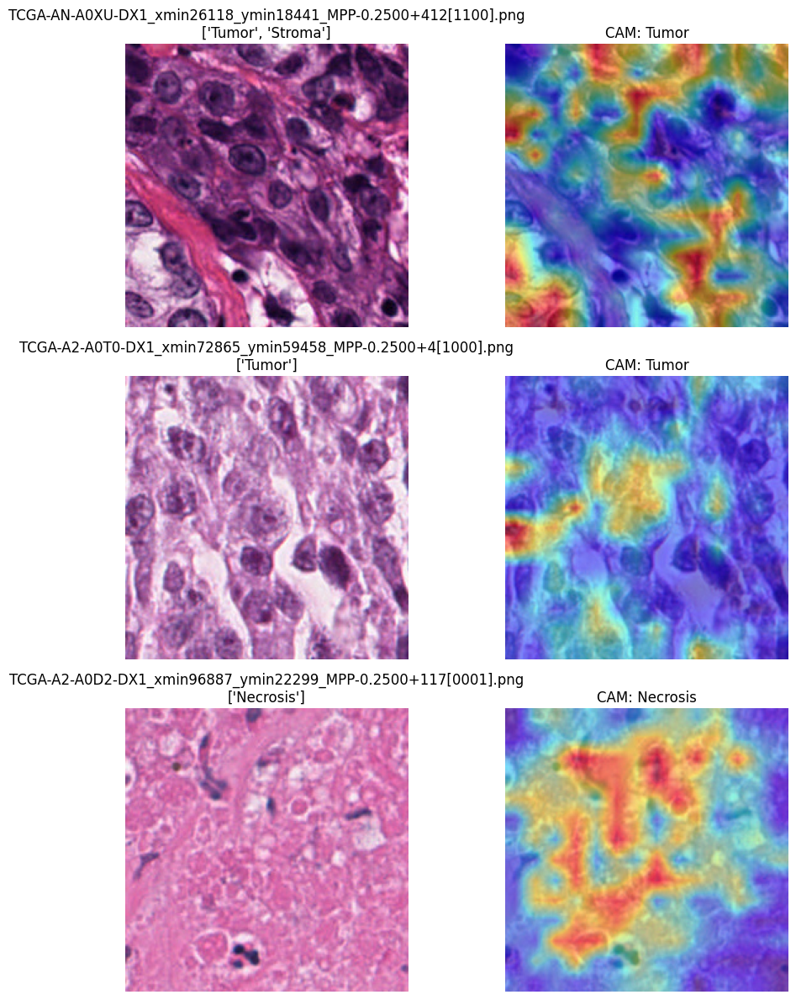

Epoch 5/5: 100%|██████████| 586/586 [05:18<00:00,  1.84it/s, loss=0.228]



[Epoch 5] Train Loss: 0.1804 (Cls: 0.153 | Proto: 0.027)
Validating...
----------------------------------------
MEAN ACC: 89.37%
  >> Tumor                    : 89.52%
  >> Stroma                   : 83.39%
  >> Lymphocytic infiltrate   : 90.07%
  >> Necrosis                 : 94.49%
----------------------------------------

[Visual Check Epoch 5] Generating CAMs...


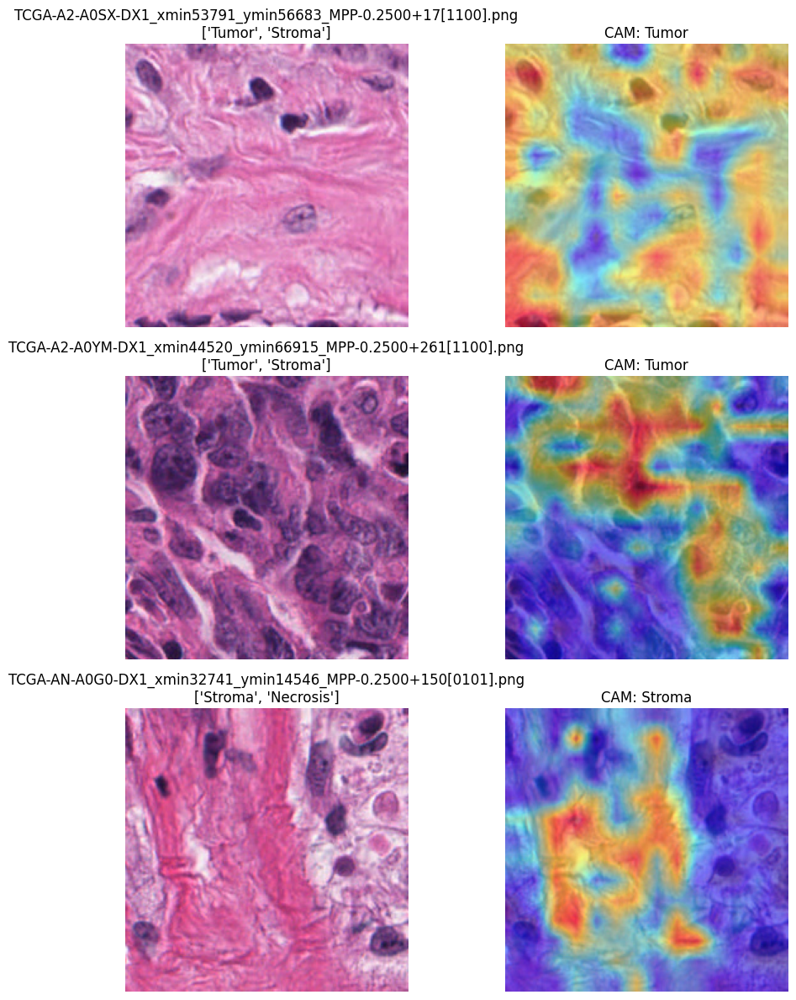

[OK] Model saved to /kaggle/working/BCSS-WSSS/classnet_pp_stage2_1.pt


In [8]:
# ============================================================
# Stage 2.1 (FINAL COMPLETE) - ClassNet++ Training
# Architecture: Residual Dilated Context Adapter
# Features:
#   - Auto Train/Val Split
#   - Contrastive Loss
#   - Visual Sanity Check (CAM Visualization)
# ============================================================

import os
import re
import random
import numpy as np
from typing import List, Dict
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from tqdm import tqdm

# ----------------------------
# 1. Config & Constants
# ----------------------------
DATA_ROOT = "/kaggle/working/BCSS-WSSS"
TRAIN_DIR = os.path.join(DATA_ROOT, "training")
HYBRID_PROTO_PATH = os.path.join(DATA_ROOT, "hybrid_prototypes.pt")
CLASSNET_CKPT_PATH = os.path.join(DATA_ROOT, "classnet_pp_stage2_1.pt")

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

BATCH_SIZE = 32
NUM_EPOCHS = 5      # 5 Epochs là đủ để hội tụ với pre-trained CLIP
LR = 1e-4           # Learning rate ổn định cho Adapter
LAMBDA_PROTO = 1.0  # Trọng số loss contrastive
PROTO_MARGIN = 0.2

classes_no_bg = ["Tumor", "Stroma", "Lymphocytic infiltrate", "Necrosis"]

# ----------------------------
# 2. Check & Setup CLIP (Frozen)
# ----------------------------
if "clip_model" not in globals() or "clip_preprocess" not in globals():
    raise RuntimeError("clip_model / clip_preprocess not found. Run Stage 0.1 first.")

clip_model.eval()
clip_model.to(DEVICE)
clip_model.float()
for p in clip_model.parameters():
    p.requires_grad = False

# Detect CLIP dimension
v = clip_model.visual
pos_emb = v.positional_embedding
INPUT_DIM = pos_emb.shape[-1]
print(f"CLIP Input Dim: {INPUT_DIM}")

def encode_image_to_tokens(model, images: torch.Tensor):
    """Encode images to patch tokens using frozen CLIP"""
    v = model.visual
    x = v.conv1(images)             # [B, Din, H, W]
    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)          # [B, N, Din]

    cls_emb = v.class_embedding.to(x.dtype)
    cls_tok = cls_emb.unsqueeze(0).unsqueeze(1).expand(x.shape[0], -1, -1)
    x = torch.cat([cls_tok, x], dim=1)

    pos_emb = v.positional_embedding.to(x.dtype)
    if pos_emb.ndim == 2: pos_emb = pos_emb.unsqueeze(0)
    if x.shape[1] != pos_emb.shape[1]:
        pos_emb = pos_emb[:, :x.shape[1], :]
    x = x + pos_emb

    x = v.ln_pre(x).permute(1, 0, 2)
    x = v.transformer(x).permute(1, 0, 2)
    x = v.ln_post(x)
    return x # [B, 1+N, Din]

# ----------------------------
# 3. Load Data & Split Train/Val
# ----------------------------
def parse_labels(fname):
    base = os.path.basename(fname)
    m = re.search(r"\[([0-9a-zA-Z]+)\]\.png$", base)
    if not m: return []
    token = m.group(1)

    l2c = {"a": "Tumor", "b": "Stroma", "c": "Lymphocytic infiltrate", "d": "Necrosis"}
    if all(c in l2c for c in token): return list(dict.fromkeys([l2c[c] for c in token]))

    p2c = ["Tumor", "Stroma", "Lymphocytic infiltrate", "Necrosis"]
    if len(token) == 4 and all(c in "01" for c in token):
        return [p2c[i] for i, c in enumerate(token) if c == "1"]
    return []

def list_images(d):
    paths = []
    for r, _, fs in os.walk(d):
        for f in fs:
            if f.lower().endswith((".png", ".jpg", ".tif")):
                paths.append(os.path.join(r, f))
    return sorted(paths)

# Load data
if "all_img_paths" in globals():
    train_img_paths, train_labels = all_img_paths, img_labels
else:
    train_img_paths = list_images(TRAIN_DIR)
    train_labels = [parse_labels(p) for p in train_img_paths]

# Filter valid & Split
all_valid_indices = [i for i, l in enumerate(train_labels) if any(c in classes_no_bg for c in l)]
random.seed(42)
random.shuffle(all_valid_indices)

val_split = 0.2
n_val = int(len(all_valid_indices) * val_split)
val_indices = all_valid_indices[:n_val]
train_indices = all_valid_indices[n_val:]

print(f"Data Split: Train={len(train_indices)} | Val={len(val_indices)}")

# ----------------------------
# 4. Advanced Model Architecture
# ----------------------------
if not os.path.exists(HYBRID_PROTO_PATH):
    raise FileNotFoundError(f"Not found: {HYBRID_PROTO_PATH}")

hybrid_bank = torch.load(HYBRID_PROTO_PATH)
hybrid_dict = hybrid_bank["hybrid_prototypes"]
PROTO_DIM = int(hybrid_bank["feat_dim"])

# Class Prototypes (Mean for Loss)
class_proto_vecs = []
for c in classes_no_bg:
    H_c = hybrid_dict[c].float()
    vec = F.normalize(H_c.mean(dim=(0, 1)), p=2, dim=-1)
    class_proto_vecs.append(vec)
class_proto_vecs = torch.stack(class_proto_vecs).to(DEVICE)

class ResidualContextBlock(nn.Module):
    """Dilated Residual Block for Context Awareness"""
    def __init__(self, in_dim, hidden_dim):
        super().__init__()
        self.reduce = nn.Sequential(
            nn.Conv2d(in_dim, hidden_dim, 1, bias=False),
            nn.BatchNorm2d(hidden_dim),
            nn.ReLU(True)
        )
        # Branch 1: Local details
        self.local = nn.Sequential(
            nn.Conv2d(hidden_dim, hidden_dim, 3, padding=1, dilation=1, bias=False),
            nn.BatchNorm2d(hidden_dim),
            nn.ReLU(True)
        )
        # Branch 2: Global context
        self.global_ctx = nn.Sequential(
            nn.Conv2d(hidden_dim, hidden_dim, 3, padding=2, dilation=2, bias=False),
            nn.BatchNorm2d(hidden_dim),
            nn.ReLU(True)
        )
        self.proj = nn.Sequential(
            nn.Conv2d(hidden_dim * 2, in_dim, 1, bias=False),
            nn.BatchNorm2d(in_dim)
        )
        self.relu = nn.ReLU(True)

    def forward(self, x):
        res = x
        out = self.reduce(x)
        l = self.local(out)
        g = self.global_ctx(out)
        out = torch.cat([l, g], dim=1)
        out = self.proj(out)
        return self.relu(out + res)

class ClassNetPP(nn.Module):
    def __init__(self, hybrid_dict, classes, input_dim, proto_dim):
        super().__init__()
        self.classes = classes
        self.proto_dim = proto_dim
        self.input_dim = input_dim

        # Store Hybrid Prototypes
        self._protos = {}
        for c in classes:
            H = hybrid_dict[c].float()
            K_v, K_t, D = H.shape
            self._protos[c] = F.normalize(H.view(K_v*K_t, D), p=2, dim=-1)

        # Advanced Adapter
        self.adapter = nn.Sequential(
            nn.Conv2d(input_dim, proto_dim, 1, bias=False), # Project
            nn.BatchNorm2d(proto_dim),
            nn.ReLU(True),
            ResidualContextBlock(proto_dim, hidden_dim=128), # Context
            nn.Conv2d(proto_dim, proto_dim, 1) # Smooth
        )
        self.logit_scale = nn.Parameter(torch.tensor(10.0))

    def forward(self, patch_feats):
        B, N, Din = patch_feats.shape
        H = W = int(N**0.5)

        # [B, N, D] -> [B, D, H, W]
        x = patch_feats.permute(0, 2, 1).view(B, Din, H, W)
        x = self.adapter(x) # [B, proto_dim, H, W]

        # Back to [B, N, D]
        x = x.view(B, self.proto_dim, N).permute(0, 2, 1)
        x = F.normalize(x, p=2, dim=-1)

        logits, act_maps = [], []
        for c in self.classes:
            proto = self._protos[c].to(x.device) # [K, D]
            sims = x @ proto.t()                 # [B, N, K]

            # CAM
            A = sims.max(dim=-1).values          # [B, N]
            act_maps.append(A.view(B, H, W).unsqueeze(1))

            # Logit
            logits.append(A.max(dim=-1).values.unsqueeze(-1))

        return torch.cat(logits, dim=-1) * self.logit_scale, torch.cat(act_maps, dim=1), x

# Init Model
classnet = ClassNetPP(hybrid_dict, classes_no_bg, INPUT_DIM, PROTO_DIM).to(DEVICE)
optimizer = torch.optim.Adam(classnet.parameters(), lr=LR)
bce_loss = nn.BCEWithLogitsLoss()

# ----------------------------
# 5. Helpers: Targets, Losses & Vis
# ----------------------------
def build_targets(lbls, classes, device):
    t = torch.zeros(len(lbls), len(classes), device=device)
    c2i = {c: i for i, c in enumerate(classes)}
    for i, l in enumerate(lbls):
        for c in l:
            if c in c2i: t[i, c2i[c]] = 1.0
    return t

def proto_contrastive_loss(feat, act, targets, protos, margin=PROTO_MARGIN):
    B, N, D = feat.shape
    act = act.view(B, len(classes_no_bg), N)
    pos_feats, pos_cls = [], []

    for b in range(B):
        for c in range(len(classes_no_bg)):
            if targets[b, c] < 0.5: continue
            scores = act[b, c]
            if scores.max() <= 0: continue

            # Select Top-K regions for positive sampling
            k = min(32, N)
            idx = scores.topk(k).indices
            pos_feats.append(feat[b, idx])
            pos_cls.append(torch.full((k,), c, dtype=torch.long, device=DEVICE))

    if not pos_feats: return torch.tensor(0.0, device=DEVICE)

    pos_feats = torch.cat(pos_feats) # [M, D]
    pos_cls = torch.cat(pos_cls)     # [M]

    # Sampling limits
    if pos_feats.shape[0] > 512:
        perm = torch.randperm(pos_feats.shape[0])[:512]
        pos_feats, pos_cls = pos_feats[perm], pos_cls[perm]

    # Contrastive
    pos_feats = F.normalize(pos_feats, p=2, dim=-1)
    protos = F.normalize(protos, p=2, dim=-1)

    pos_p = protos[pos_cls]

    # Negative mining
    rand_idx = torch.randint(0, len(classes_no_bg), (pos_cls.shape[0],), device=DEVICE)
    neg_idx = torch.where(rand_idx == pos_cls, (rand_idx + 1) % len(classes_no_bg), rand_idx)
    neg_p = protos[neg_idx]

    sim_pos = (pos_feats * pos_p).sum(-1)
    sim_neg = (pos_feats * neg_p).sum(-1)

    return F.relu(margin - (sim_pos - sim_neg)).mean()

def visualize_sanity_check(model, dataset_paths, dataset_labels, epoch, num_samples=3):
    """ Vẽ ngẫu nhiên một vài mẫu Validation kèm CAM heatmap """
    model.eval()
    indices = random.sample(range(len(dataset_paths)), num_samples)

    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 4*num_samples))
    if num_samples == 1: axes = axes[None, :]

    print(f"\n[Visual Check Epoch {epoch}] Generating CAMs...")

    with torch.no_grad():
        for idx, i in enumerate(indices):
            path = dataset_paths[i]
            lbls = dataset_labels[i]

            try:
                raw_img = Image.open(path).convert("RGB")
                inp = clip_preprocess(raw_img).unsqueeze(0).to(DEVICE)
            except: continue

            toks = encode_image_to_tokens(clip_model, inp)
            _, act_maps, _ = model(toks[:, 1:])

            # Lấy CAM của class đầu tiên
            target_class = "Tumor" if "Tumor" in lbls else lbls[0]
            if target_class not in classes_no_bg: target_class = lbls[0]
            c_idx = classes_no_bg.index(target_class)
            cam = act_maps[0, c_idx]

            cam = (cam - cam.min()) / (cam.max() + 1e-7)
            cam = cam.cpu().numpy()
            cam_resized = np.array(Image.fromarray(cam).resize(raw_img.size, Image.BILINEAR))

            axes[idx, 0].imshow(raw_img)
            axes[idx, 0].set_title(f"{os.path.basename(path)}\n{lbls}")
            axes[idx, 0].axis("off")

            axes[idx, 1].imshow(raw_img)
            axes[idx, 1].imshow(cam_resized, cmap='jet', alpha=0.5)
            axes[idx, 1].set_title(f"CAM: {target_class}")
            axes[idx, 1].axis("off")

    plt.tight_layout()
    plt.show()

def validate(model, idx_list, paths, labels):
    model.eval()
    correct = torch.zeros(len(classes_no_bg), device=DEVICE)
    total = 0

    with torch.no_grad():
        for start in range(0, len(idx_list), BATCH_SIZE):
            batch = idx_list[start:start+BATCH_SIZE]
            if not batch: continue

            imgs, batch_lbls = [], []
            for i in batch:
                try:
                    imgs.append(clip_preprocess(Image.open(paths[i]).convert("RGB")))
                    batch_lbls.append(labels[i])
                except: continue

            if not imgs: continue
            img_t = torch.stack(imgs).to(DEVICE)

            toks = encode_image_to_tokens(clip_model, img_t)
            logits, _, _ = model(toks[:, 1:])

            targs = build_targets(batch_lbls, classes_no_bg, DEVICE)
            preds = (torch.sigmoid(logits) > 0.5).float()

            correct += (preds == targs).float().sum(0)
            total += preds.shape[0]

    if total == 0: return {}
    return {c: (correct[i]/total).item()*100 for i, c in enumerate(classes_no_bg)}

# ----------------------------
# 6. Training Loop
# ----------------------------
for epoch in range(1, NUM_EPOCHS + 1):
    classnet.train()
    metrics = {"loss": 0, "cls": 0, "proto": 0}
    n_batches = 0

    random.shuffle(train_indices)
    pbar = tqdm(range(0, len(train_indices), BATCH_SIZE), desc=f"Epoch {epoch}/{NUM_EPOCHS}")

    for start in pbar:
        batch = train_indices[start:start+BATCH_SIZE]

        # Load Batch
        imgs, batch_lbls = [], []
        for i in batch:
            if not any(c in classes_no_bg for c in train_labels[i]): continue
            try:
                imgs.append(clip_preprocess(Image.open(train_img_paths[i]).convert("RGB")))
                batch_lbls.append(train_labels[i])
            except: continue

        if not imgs: continue
        img_t = torch.stack(imgs).to(DEVICE)

        # Forward
        with torch.no_grad():
            toks = encode_image_to_tokens(clip_model, img_t)

        logits, acts, feats = classnet(toks[:, 1:])
        targets = build_targets(batch_lbls, classes_no_bg, DEVICE)

        # Loss
        l_cls = bce_loss(logits, targets)
        l_proto = proto_contrastive_loss(feats, acts, targets, class_proto_vecs)
        loss = l_cls + LAMBDA_PROTO * l_proto

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        metrics["loss"] += loss.item()
        metrics["cls"] += l_cls.item()
        metrics["proto"] += l_proto.item()
        n_batches += 1

        pbar.set_postfix({"loss": f"{loss.item():.3f}"})

    # --- End of Epoch Validation ---
    print(f"\n[Epoch {epoch}] Train Loss: {metrics['loss']/n_batches:.4f} (Cls: {metrics['cls']/n_batches:.3f} | Proto: {metrics['proto']/n_batches:.3f})")

    print("Validating...")
    val_acc = validate(classnet, val_indices, train_img_paths, train_labels)
    print("-" * 40)
    print(f"MEAN ACC: {sum(val_acc.values())/len(classes_no_bg):.2f}%")
    for c, acc in val_acc.items():
        print(f"  >> {c:25}: {acc:.2f}%")
    print("-" * 40)

    # [VISUAL CHECK]
    val_paths = [train_img_paths[i] for i in val_indices]
    val_lbls_sub = [train_labels[i] for i in val_indices]
    visualize_sanity_check(classnet, val_paths, val_lbls_sub, epoch)

# Save Checkpoint
save_dict = {
    "state_dict": classnet.state_dict(),
    "config": {"input_dim": INPUT_DIM, "proto_dim": PROTO_DIM},
    "classes": classes_no_bg
}
torch.save(save_dict, CLASSNET_CKPT_PATH)
print(f"[OK] Model saved to {CLASSNET_CKPT_PATH}")

Model loaded for evaluation.
Evaluating on 4986 test images...


Evaluating Pseudo Masks with CAA: 100%|██████████| 4986/4986 [05:03<00:00, 16.45it/s]



PSEUDO MASK EVALUATION RESULTS (CAA)
Class Tumor                    : 87.49%
Class Stroma                   : 70.92%
Class Lymphocytic infiltrate   : 86.77%
Class Necrosis                 : 53.79%
----------------------------------------
MEAN IOU (mIoU)                       : 74.74%


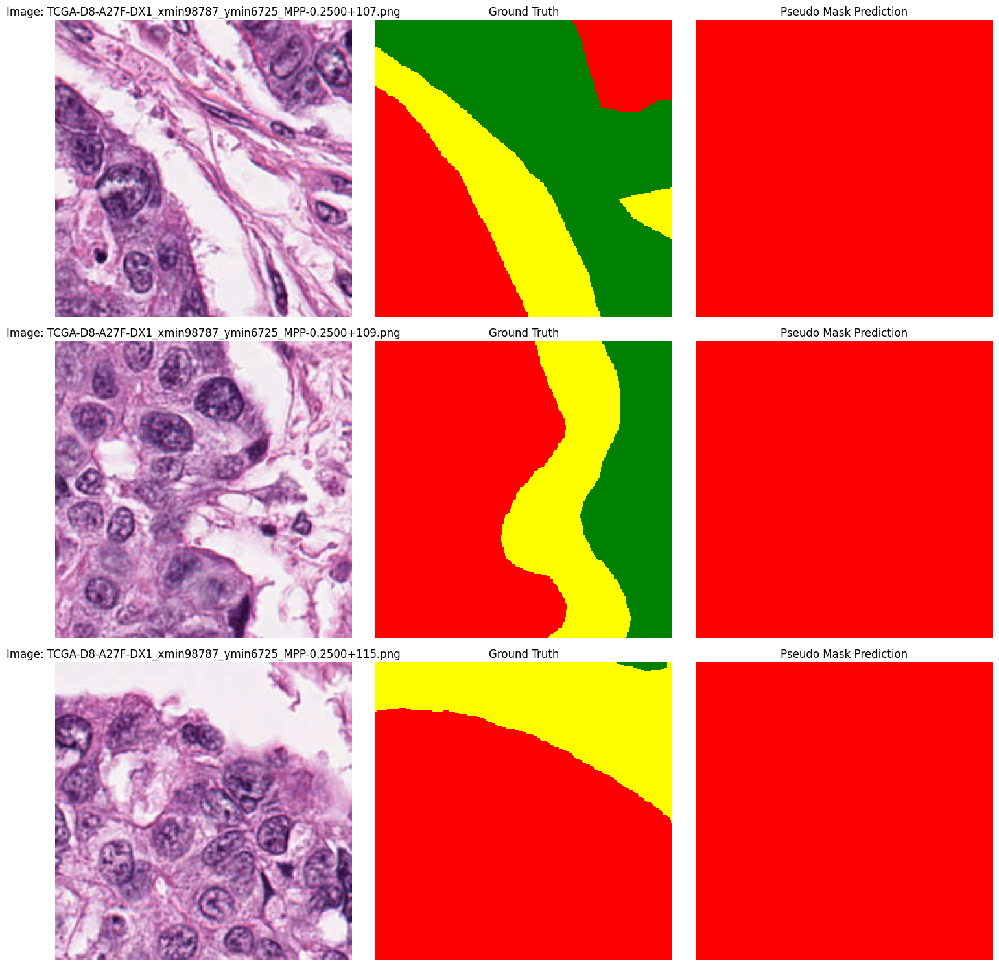

In [9]:
# ============================================================
# Stage 2.2 (EVALUATION MODE) - Validate Pseudo Mask Quality
# Tinh chỉnh CAM bằng Class-aware Attention-based Affinity (CAA)
# ============================================================

import os
import glob
import re
import numpy as np
from typing import List, Dict

import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cv2 # Cần thư viện OpenCV cho việc tìm contour

# ----------------------------
# 1. Config & Paths
# ----------------------------
DATA_ROOT = "/kaggle/working/BCSS-WSSS"

VAL_IMG_DIR = os.path.join(DATA_ROOT, "test", "img")
VAL_MASK_DIR = os.path.join(DATA_ROOT, "test", "mask")

HYBRID_PROTO_PATH = os.path.join(DATA_ROOT, "hybrid_prototypes.pt")
CLASSNET_CKPT_PATH = os.path.join(DATA_ROOT, "classnet_pp_stage2_1.pt")

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# Multi-scale & post-processing config
SCALES = [1.0, 0.8, 1.2]

# Cấu hình CAA (thay thế cho PCRE/FFR)
CAA_NUM_ITERS = 5       # Số lần lặp Sinkhorn
CAA_ATTN_POWER = 3      # Lũy thừa t của ma trận tương đồng A^t (số lần lặp tinh chỉnh)
CAA_THR_LAMBDA = 0.20   # Ngưỡng lambda để tạo mask hộp giới hạn Bc

# Threshold cho pixel "đủ tin cậy" để gán class
CONF_THR = 0.05     # nếu max score < CONF_THR -> ignore pixel khi tính IoU

classes_no_bg = ["Tumor", "Stroma", "Lymphocytic infiltrate", "Necrosis"]
NUM_CLASSES = len(classes_no_bg)

# ----------------------------
# 2. Setup CLIP & ClassNetPP
# ----------------------------
if "clip_model" not in globals():
    raise RuntimeError("Load CLIP (Stage 0.1) first!")

clip_model.eval().to(DEVICE)


def encode_image_to_tokens(model, images: torch.Tensor):
    """
    Trả về token features [B, 1+N, D] sau transformer
    """
    v = model.visual
    x = v.conv1(images)                 # [B, C, H, W]
    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)              # [B, N, C]

    cls_emb = v.class_embedding.to(x.dtype)
    cls_tok = cls_emb.unsqueeze(0).unsqueeze(1).expand(x.shape[0], -1, -1)
    x = torch.cat([cls_tok, x], dim=1)  # [B, 1+N, C]

    pos_emb = v.positional_embedding.to(x.dtype)
    if pos_emb.ndim == 2:
        pos_emb = pos_emb.unsqueeze(0)  # [1, 1+N, C]
    if x.shape[1] != pos_emb.shape[1]:
        pos_emb = pos_emb[:, :x.shape[1], :]
    x = x + pos_emb

    x = v.ln_pre(x).permute(1, 0, 2)
    x = v.transformer(x).permute(1, 0, 2)
    x = v.ln_post(x)
    return x                            # [B, 1+N, D]


class ResidualContextBlock(nn.Module):
    # ... (giữ nguyên Class ResidualContextBlock) ...
    def __init__(self, in_dim, hidden_dim):
        super().__init__()
        self.reduce = nn.Sequential(
            nn.Conv2d(in_dim, hidden_dim, 1, bias=False),
            nn.BatchNorm2d(hidden_dim),
            nn.ReLU(True),
        )
        self.local = nn.Sequential(
            nn.Conv2d(hidden_dim, hidden_dim, 3, padding=1, dilation=1, bias=False),
            nn.BatchNorm2d(hidden_dim),
            nn.ReLU(True),
        )
        self.global_ctx = nn.Sequential(
            nn.Conv2d(hidden_dim, hidden_dim, 3, padding=2, dilation=2, bias=False),
            nn.BatchNorm2d(hidden_dim),
            nn.ReLU(True),
        )
        self.proj = nn.Sequential(
            nn.Conv2d(hidden_dim * 2, in_dim, 1, bias=False),
            nn.BatchNorm2d(in_dim),
        )
        self.relu = nn.ReLU(True)

    def forward(self, x):
        res = x
        out = self.reduce(x)
        l = self.local(out)
        g = self.global_ctx(out)
        out = torch.cat([l, g], dim=1)
        out = self.proj(out)
        return self.relu(out + res)


class ClassNetPP(nn.Module):
    # ... (giữ nguyên Class ClassNetPP) ...
    def __init__(self, hybrid_dict, classes, input_dim, proto_dim):
        super().__init__()
        self.classes = classes
        self.proto_dim = proto_dim
        self.input_dim = input_dim

        self._protos = {}
        for c in classes:
            H = hybrid_dict[c].float()
            K_v, K_t, D = H.shape
            self._protos[c] = F.normalize(H.view(K_v * K_t, D), p=2, dim=-1)

        self.adapter = nn.Sequential(
            nn.Conv2d(input_dim, proto_dim, 1, bias=False),
            nn.BatchNorm2d(proto_dim),
            nn.ReLU(True),
            ResidualContextBlock(proto_dim, hidden_dim=128),
            nn.Conv2d(proto_dim, proto_dim, 1),
        )
        self.logit_scale = nn.Parameter(torch.tensor(10.0))

    def forward(self, patch_feats):
        B, N, Din = patch_feats.shape
        H = W = int(N ** 0.5)

        x = patch_feats.permute(0, 2, 1).view(B, Din, H, W)
        x = self.adapter(x)
        x = x.view(B, self.proto_dim, N).permute(0, 2, 1)
        x = F.normalize(x, p=2, dim=-1) # x: [B, N, D] - patch_feats_norm

        logits, act_maps = [], []
        for c in self.classes:
            proto = self._protos[c].to(x.device)    # [K, D]
            sims = x @ proto.t()                    # [B, N, K]

            A = sims.max(dim=-1).values             # [B, N]
            act_maps.append(A.view(B, H, W).unsqueeze(1))
            logits.append(A.max(dim=-1).values.unsqueeze(-1))

        return torch.cat(logits, dim=-1) * self.logit_scale, torch.cat(act_maps, dim=1), x
# --- Load weights ---
if not os.path.exists(HYBRID_PROTO_PATH) or not os.path.exists(CLASSNET_CKPT_PATH):
    raise FileNotFoundError("Missing checkpoints for hybrid prototypes / ClassNet++")

hybrid_bank = torch.load(HYBRID_PROTO_PATH, map_location="cpu")
ckpt = torch.load(CLASSNET_CKPT_PATH, map_location=DEVICE)

INPUT_DIM = int(ckpt.get("config", {}).get("input_dim", 768))
PROTO_DIM = int(ckpt.get("config", {}).get("proto_dim", 512))

classnet = ClassNetPP(hybrid_bank["hybrid_prototypes"], classes_no_bg, INPUT_DIM, PROTO_DIM).to(DEVICE)
classnet.load_state_dict(ckpt["state_dict"])
classnet.eval()
print("Model loaded for evaluation.")


# ----------------------------
# 3. CAA Refinement
# ----------------------------

def sinkhorn_norm(A: torch.Tensor, num_iters: int = CAA_NUM_ITERS):
    """
    Thực hiện Sinkhorn Normalization: D = Sinkhorn(A).
    A: [N, N] ma trận attention/affinity (không cần không âm, nhưng ReLU giúp ổn định)
    Return: [N, N] ma trận doubly stochastic D
    """
    D = F.relu(A) + 1e-7 # Khởi tạo không âm
    
    for _ in range(num_iters):
        # Chuẩn hóa hàng (Row-normalization)
        D = D / D.sum(dim=1, keepdim=True)
        # Chuẩn hóa cột (Column-normalization)
        D = D / D.sum(dim=0, keepdim=True)
        
    return D


def get_box_mask(cam: torch.Tensor, lambda_thr: float):
    """
    Tạo mặt nạ hộp giới hạn Bc từ CAM đã chuẩn hoá.
    cam: [H, W] đã chuẩn hoá 0-1
    lambda_thr: Ngưỡng để tạo mask nhị phân ban đầu
    Return: Bc [1, N] (N = H*W) mặt nạ hộp giới hạn (0 hoặc 1)
    """
    H, W = cam.shape
    
    # 1. Ngưỡng hóa và chuyển về numpy/uint8
    cam_np = cam.cpu().numpy()
    binary_mask = (cam_np > lambda_thr).astype(np.uint8)
    
    if binary_mask.sum() == 0:
        return torch.zeros(1, H * W, dtype=torch.bool, device=cam.device)
    
    # 2. Tìm các vùng liên thông (contours)
    # cv2.RETR_EXTERNAL: chỉ lấy contour ngoài cùng
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # 3. Tính hộp giới hạn bao phủ và tạo mask
    final_box_mask = np.zeros_like(binary_mask, dtype=np.uint8)
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        # Vẽ hình chữ nhật bao phủ lên mask
        final_box_mask[y:y+h, x:x+w] = 1
        
    # 4. Vector hóa Bc
    # Chuyển về float để nhân Hadamard
    Bc = torch.from_numpy(final_box_mask).flatten().unsqueeze(0).to(cam.device).float()
    
    return Bc # [1, H*W]


def caa_refinement(cam_norm: torch.Tensor, patch_feats_norm: torch.Tensor,
                   t: int = CAA_ATTN_POWER, lambda_thr: float = CAA_THR_LAMBDA):
    """
    Thực hiện Class-aware Attention-based Affinity (CAA) refinement: 
    M_c^aff = (B_c ⊙ A^t) * vec(M_c)
    cam_norm: [h, w] CAM đã chuẩn hoá 0-1 (kích thước token)
    patch_feats_norm: [N, D] token features đã qua adapter và chuẩn hoá.
    Return: cam_refined [h, w]
    """
    H, W = cam_norm.shape
    N = H * W
    
    # --- 1. Tính Ma trận Tương đồng đối xứng A ---
    # Wattn xấp xỉ bằng Self-Similarity [N, N]
    Wattn = patch_feats_norm @ patch_feats_norm.t() 
    
    # D = Sinkhorn(W^attn) (Eq. 6)
    D = sinkhorn_norm(Wattn, num_iters=CAA_NUM_ITERS)
    
    # A = (D + D^T) / 2 (Eq. 6)
    A = (D + D.t()) / 2
    
    # --- 2. Tính Ma trận A^t và Mask hộp giới hạn Bc ---
    
    # A^t (lan truyền tương đồng t lần)
    A_t = torch.matrix_power(A, t) # [N, N]
    
    # Bc (Box Mask) [1, N]
    Bc = get_box_mask(cam_norm, lambda_thr=lambda_thr)
    
    # Vector hóa CAM ban đầu
    vec_Mc = cam_norm.flatten().unsqueeze(1) # [N, 1]
    
    # --- 3. Tinh chỉnh CAM (Eq. 7) ---
    
    # Bc (1, N) ⊙ A^t (N, N) -> Bc.t() * A_t
    # Bc.t() [N, 1] * A_t [N, N] -> [N, N]
    A_t_masked = Bc.t() * A_t
    
    # M_c^aff = (B_c ⊙ A^t) * vec(M_c)
    vec_Mc_aff = A_t_masked @ vec_Mc # [N, N] @ [N, 1] -> [N, 1]
    
    # Reshape về [H, W]
    cam_refined = vec_Mc_aff.view(H, W)
    
    # Chuẩn hóa lại (0-1)
    if cam_refined.max() > 1e-7:
        cam_refined = (cam_refined - cam_refined.min()) / (cam_refined.max() + 1e-7)
    
    return cam_refined


# ----------------------------
# 4. Main Evaluation Loop
# ----------------------------
# ... (Phần PCRE/FFR đã bỏ đi) ...

val_images = sorted(glob.glob(os.path.join(VAL_IMG_DIR, "*.png")))
print(f"Evaluating on {len(val_images)} test images...")

hist = torch.zeros(NUM_CLASSES, NUM_CLASSES, device=DEVICE)
visual_samples = []

for i, img_path in tqdm(list(enumerate(val_images)), total=len(val_images),
                         desc="Evaluating Pseudo Masks with CAA"):
    mask_path = os.path.join(VAL_MASK_DIR, os.path.basename(img_path))
    if not os.path.exists(mask_path):
        continue

    try:
        img_pil = Image.open(img_path).convert("RGB")
        mask_pil = Image.open(mask_path)
        # GT mask đã được remap về 0..3 ở bước chuẩn bị
        gt_mask = torch.from_numpy(np.array(mask_pil)).long().to(DEVICE)
        gt_mask = F.interpolate(gt_mask[None, None].float(),
                                size=(224, 224),
                                mode="nearest").squeeze(0).squeeze(0).long()
    except Exception:
        continue

    # Lấy label ảnh từ GT
    unique_classes = torch.unique(gt_mask)
    lbls = [classes_no_bg[c] for c in unique_classes
            if 0 <= int(c) < NUM_CLASSES]
    if not lbls:
        continue

    refined_cams_per_scale = []

    with torch.no_grad():
        for scale in SCALES:
            # scale ảnh (nếu != 1.0)
            if scale != 1.0:
                new_size = (int(img_pil.width * scale),
                            int(img_pil.height * scale))
                img_in = img_pil.resize(new_size, Image.BICUBIC)
            else:
                img_in = img_pil

            # CLIP preprocess -> (3, H_in, W_in) ~ (3, 224, 224)
            pp = clip_preprocess(img_in)
            inp = pp.unsqueeze(0).to(DEVICE)
            target_size = pp.shape[-2:]       # (H_in, W_in)

            toks = encode_image_to_tokens(clip_model, inp)
            # THAY ĐỔI: Lấy cả patch_feats_norm (x)
            _, act_maps, patch_feats_norm = classnet(toks[:, 1:])  # act_maps: [B, C, h, w], patch_feats_norm: [B, N, D]
            act_maps = act_maps.squeeze(0)                         # [C, h, w]
            
            # Extract N, D từ token (chỉ cần lấy [N, D] vì B=1)
            token_feats = patch_feats_norm.squeeze(0)              # [N, D]
            H_tok = W_tok = int(token_feats.shape[0] ** 0.5)

            # --- Upsample CAM lên độ phân giải cao ---
            cams_hi = F.interpolate(
                act_maps.unsqueeze(0),
                size=target_size,
                mode="bilinear",
                align_corners=False
            ).squeeze(0)                                        # [C, H_in, W_in]

            refined = torch.zeros_like(cams_hi)

            for ci, c in enumerate(classes_no_bg):
                if c not in lbls:
                    continue

                cam = cams_hi[ci]
                # Chuẩn hoá 0-1
                cam_norm = (cam - cam.min()) / (cam.max() + 1e-7)

                # 1. Resize cam_norm về kích thước token [h, w]
                cam_norm_tok = F.interpolate(
                    cam_norm.unsqueeze(0).unsqueeze(0),
                    size=(H_tok, W_tok),
                    mode="bilinear",
                    align_corners=False
                ).squeeze(0).squeeze(0)

                # 2. Thực hiện CAA Refinement trên độ phân giải token
                refined_cam_tok = caa_refinement(
                    cam_norm_tok, token_feats, 
                    t=CAA_ATTN_POWER, lambda_thr=CAA_THR_LAMBDA
                )
                
                # 3. Resize ngược lại về độ phân giải cao (H_in, W_in)
                refined_cam = F.interpolate(
                    refined_cam_tok.unsqueeze(0).unsqueeze(0),
                    size=target_size,
                    mode="bilinear",
                    align_corners=False
                ).squeeze(0).squeeze(0)
                
                refined[ci] = refined_cam

            refined_cams_per_scale.append(refined)

    if not refined_cams_per_scale:
        continue

    # Multi-scale fusion (mean)
    cams_stack = torch.stack(refined_cams_per_scale, dim=0)  # [S, C, H, W]
    P = cams_stack.mean(dim=0)                               # [C, H, W]

    # Resize về 224x224 (để khớp với GT mask)
    if P.shape[1:] != (224, 224):
        P_resized = F.interpolate(
            P.unsqueeze(0),
            size=(224, 224),
            mode="bilinear",
            align_corners=False
        ).squeeze(0)
    else:
        P_resized = P

    # --- Tạo pseudo mask với threshold (tránh CAM=0 -> Tumor) ---
    max_vals, pred_mask = P_resized.max(dim=0)    # [H, W]
    ignore_label = -1

    pred_mask = torch.where(
        max_vals > CONF_THR,
        pred_mask,
        torch.full_like(pred_mask, ignore_label)
    )

    # --- Cập nhật confusion matrix ---
    valid = (gt_mask >= 0) & (gt_mask < NUM_CLASSES) & (pred_mask >= 0)
    if valid.sum() == 0:
        continue

    hist += torch.bincount(
        NUM_CLASSES * gt_mask[valid] + pred_mask[valid],
        minlength=NUM_CLASSES ** 2
    ).view(NUM_CLASSES, NUM_CLASSES)

    # Lưu vài sample để vẽ
    if len(visual_samples) < 3:
        visual_samples.append({
            "img": np.array(img_pil.resize((224, 224))),
            "pred": pred_mask.cpu().numpy(),
            "gt": gt_mask.cpu().numpy(),
            "name": os.path.basename(img_path),
        })

# ----------------------------
# 5. Calculate & Print mIoU
# ----------------------------
ious = []
print("\n" + "=" * 40)
print("PSEUDO MASK EVALUATION RESULTS (CAA)")
print("=" * 40)

for i, c in enumerate(classes_no_bg):
    tp = hist[i, i]
    union = hist[i, :].sum() + hist[:, i].sum() - tp
    iou = (tp / (union + 1e-7)).item()
    ious.append(iou)
    print(f"Class {c:<25}: {iou * 100:.2f}%")

miou = sum(ious) / len(ious)
print("-" * 40)
print(f"MEAN IOU (mIoU)                       : {miou * 100:.2f}%")
print("=" * 40)

# ----------------------------
# 6. Visualize a few examples
# ----------------------------
if visual_samples:
    cmap = mcolors.ListedColormap(['red', 'green', 'blue', 'yellow'])
    norm = mcolors.BoundaryNorm(np.arange(NUM_CLASSES + 1) - 0.5, NUM_CLASSES)

    fig, axes = plt.subplots(len(visual_samples), 3,
                             figsize=(15, 5 * len(visual_samples)))
    if len(visual_samples) == 1:
        axes = axes[None, :]

    for idx, sample in enumerate(visual_samples):
        axes[idx, 0].imshow(sample["img"])
        axes[idx, 0].set_title(f"Image: {sample['name']}")
        axes[idx, 0].axis("off")

        axes[idx, 1].imshow(sample["gt"], cmap=cmap, norm=norm,
                            interpolation="nearest")
        axes[idx, 1].set_title("Ground Truth")
        axes[idx, 1].axis("off")

        axes[idx, 2].imshow(sample["pred"], cmap=cmap, norm=norm,
                            interpolation="nearest")
        axes[idx, 2].set_title("Pseudo Mask Prediction")
        axes[idx, 2].axis("off")

    plt.tight_layout()
    plt.show()

In [10]:
# # ============================================================
# # Stage 3 (FIXED) – Segmentation network + self-training
# # ============================================================

# import os
# import re
# import glob
# from typing import List, Dict, Tuple

# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# from torch.utils.data import Dataset, DataLoader

# from PIL import Image
# from tqdm import tqdm
# import torchvision.transforms as T

# # ----------------------------
# # Basic paths & config
# # ----------------------------
# DATA_ROOT = "/kaggle/working/BCSS-WSSS"
# PSEUDO_DIR = os.path.join(DATA_ROOT, "pseudo_stage2")
# TEST_IMG_DIR = os.path.join(DATA_ROOT, "test", "img")
# TEST_MASK_DIR = os.path.join(DATA_ROOT, "test", "mask")

# HYBRID_PROTO_PATH = os.path.join(DATA_ROOT, "hybrid_prototypes.pt")
# SEG_CKPT_PATH = os.path.join(DATA_ROOT, "segnet_stage3.pt")

# DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# NUM_CLASSES = 4   # TUM, STR, LYM, NEC
# classes_no_bg = ["Tumor", "Stroma", "Lymphocytic infiltrate", "Necrosis"]

# BATCH_SIZE = 8
# NUM_EPOCHS = 5
# NUM_SELF_TRAIN_ROUNDS = 1

# L_SEG_WEIGHT = 1.0
# L_PROTO_WEIGHT = 0.5
# L_CONS_WEIGHT = 0.5
# PROTO_TEMPERATURE = 0.07

# IMG_SIZE = 224

# # ----------------------------
# # Check CLIP & hybrid prototypes
# # ----------------------------
# if not os.path.exists(PSEUDO_DIR):
#     raise FileNotFoundError(f"Pseudo masks directory not found: {PSEUDO_DIR}")

# if not os.path.exists(HYBRID_PROTO_PATH):
#     raise FileNotFoundError(f"Hybrid prototypes file not found: {HYBRID_PROTO_PATH}")

# hybrid_bank = torch.load(HYBRID_PROTO_PATH, map_location="cpu")
# hybrid_prototypes_dict: Dict[str, torch.Tensor] = hybrid_bank["hybrid_prototypes"]
# PROTO_DIM = int(hybrid_bank["feat_dim"])

# # Class prototypes
# class_proto_vecs = []
# for c in classes_no_bg:
#     H_c = hybrid_prototypes_dict[c].float()  # [K_v,K_t,D]
#     proto_vec = H_c.mean(dim=(0, 1))         # [D]
#     proto_vec = F.normalize(proto_vec, p=2, dim=-1)
#     class_proto_vecs.append(proto_vec)
# class_proto_vecs = torch.stack(class_proto_vecs, dim=0).to(DEVICE)  # [C, D]
# print("Loaded class prototypes:", class_proto_vecs.shape)

# # ------------------------------------------------------------
# # 3.1 UNet segmentation network (Standard)
# # ------------------------------------------------------------
# class DoubleConv(nn.Module):
#     def __init__(self, in_channels, out_channels):
#         super().__init__()
#         self.block = nn.Sequential(
#             nn.Conv2d(in_channels, out_channels, 3, padding=1),
#             nn.BatchNorm2d(out_channels),
#             nn.ReLU(inplace=True),
#             nn.Conv2d(out_channels, out_channels, 3, padding=1),
#             nn.BatchNorm2d(out_channels),
#             nn.ReLU(inplace=True),
#         )
#     def forward(self, x): return self.block(x)

# class Down(nn.Module):
#     def __init__(self, in_channels, out_channels):
#         super().__init__()
#         self.block = nn.Sequential(nn.MaxPool2d(2), DoubleConv(in_channels, out_channels))
#     def forward(self, x): return self.block(x)

# class Up(nn.Module):
#     def __init__(self, in_channels, out_channels, bilinear=True):
#         super().__init__()
#         if bilinear:
#             self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False)
#             self.conv = DoubleConv(in_channels, out_channels)
#         else:
#             self.up = nn.ConvTranspose2d(in_channels // 2, in_channels // 2, 2, stride=2)
#             self.conv = DoubleConv(in_channels, out_channels)

#     def forward(self, x1, x2):
#         x1 = self.up(x1)
#         diffY = x2.size()[2] - x1.size()[2]
#         diffX = x2.size()[3] - x1.size()[3]
#         x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])
#         x = torch.cat([x2, x1], dim=1)
#         return self.conv(x)

# class UNetWithEmbedding(nn.Module):
#     def __init__(self, n_channels=3, n_classes=NUM_CLASSES, emb_dim=PROTO_DIM, bilinear=True):
#         super().__init__()
#         self.inc = DoubleConv(n_channels, 64)
#         self.down1 = Down(64, 128)
#         self.down2 = Down(128, 256)
#         self.down3 = Down(256, 512)
#         factor = 2 if bilinear else 1
#         self.down4 = Down(512, 1024 // factor)
#         self.up1 = Up(1024, 512 // factor, bilinear)
#         self.up2 = Up(512, 256 // factor, bilinear)
#         self.up3 = Up(256, 128 // factor, bilinear)
#         self.up4 = Up(128, 64, bilinear)
#         self.out_seg = nn.Conv2d(64, n_classes, kernel_size=1)
#         self.out_emb = nn.Conv2d(64, emb_dim, kernel_size=1)

#     def forward(self, x):
#         x1 = self.inc(x)
#         x2 = self.down1(x1)
#         x3 = self.down2(x2)
#         x4 = self.down3(x3)
#         x5 = self.down4(x4)
#         x = self.up1(x5, x4)
#         x = self.up2(x, x3)
#         x = self.up3(x, x2)
#         x = self.up4(x, x1)
#         logits = self.out_seg(x)
#         emb = self.out_emb(x)
#         return logits, emb

# seg_net = UNetWithEmbedding().to(DEVICE)

# # ------------------------------------------------------------
# # 3.2 Dataset
# # ------------------------------------------------------------
# class PseudoSegDataset(Dataset):
#     def __init__(self, pseudo_dir, train_root, img_size=224):
#         self.pseudo_dir = pseudo_dir
#         self.img_size = img_size
#         self.img_paths = []
#         for root, _, files in os.walk(train_root):
#             for f in files:
#                 if f.lower().endswith((".png", ".jpg")):
#                     self.img_paths.append(os.path.join(root, f))
#         self.stem2path = {os.path.splitext(os.path.basename(p))[0]: p for p in self.img_paths}
#         self.pseudo_files = sorted(glob.glob(os.path.join(pseudo_dir, "*_pseudo.pt")))

#         self.weak_transform = T.Compose([
#             T.Resize((img_size, img_size)),
#             T.ToTensor(),
#             T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
#         ])
#         self.strong_transform = T.Compose([
#             T.Resize((img_size, img_size)),
#             T.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.05),
#             T.ToTensor(),
#             T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
#         ])

#     def __len__(self): return len(self.pseudo_files)

#     def __getitem__(self, idx):
#         path = self.pseudo_files[idx]
#         data = torch.load(path, map_location="cpu")
#         P, W = data["P"], data["W"]
#         stem = os.path.basename(path).replace("_pseudo.pt", "")
#         img = Image.open(self.stem2path[stem]).convert("RGB")

#         # Resize P, W to target size
#         P = F.interpolate(P.unsqueeze(0), size=(self.img_size, self.img_size), mode="bilinear", align_corners=False).squeeze(0)
#         W = F.interpolate(W.unsqueeze(0).unsqueeze(0), size=(self.img_size, self.img_size), mode="bilinear", align_corners=False).squeeze(0).squeeze(0)

#         return self.weak_transform(img), self.strong_transform(img), P, W

# train_loader = DataLoader(
#     PseudoSegDataset(PSEUDO_DIR, TRAIN_DIR, IMG_SIZE),
#     batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True
# )

# # Test Dataset
# class TestSegDataset(Dataset):
#     def __init__(self, img_dir, mask_dir, img_size=224):
#         self.img_paths = sorted(glob.glob(os.path.join(img_dir, "*.png")))
#         self.mask_dir = mask_dir
#         self.img_size = img_size
#         self.to_tensor = T.Compose([
#             T.Resize((img_size, img_size)),
#             T.ToTensor(),
#             T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
#         ])

#     def __len__(self): return len(self.img_paths)

#     def __getitem__(self, idx):
#         img_path = self.img_paths[idx]
#         mask_path = os.path.join(self.mask_dir, os.path.basename(img_path))
#         img = self.to_tensor(Image.open(img_path).convert("RGB"))
#         mask = Image.open(mask_path)
#         mask = torch.from_numpy(np.array(mask).astype("int64"))
#         mask = F.interpolate(mask.unsqueeze(0).unsqueeze(0).float(), size=(self.img_size, self.img_size), mode="nearest").squeeze().long()
#         return img, mask

# import numpy as np
# test_loader = DataLoader(TestSegDataset(TEST_IMG_DIR, TEST_MASK_DIR, IMG_SIZE), batch_size=4, shuffle=False)

# # ------------------------------------------------------------
# # 3.3 Losses (FIXED SHADOWING BUG)
# # ------------------------------------------------------------
# seg_optimizer = torch.optim.Adam(seg_net.parameters(), lr=1e-4)

# def segmentation_loss(logits, P, W):
#     pseudo_cls = P.argmax(dim=1)
#     loss = (F.cross_entropy(logits, pseudo_cls, reduction="none") * W).sum() / (W.sum() + 1e-7)
#     return loss

# def prototype_contrastive_loss_pixel(emb, P, W, class_proto_vecs, temperature=PROTO_TEMPERATURE):
#     # [FIX] Không unpack 'W' để tránh ghi đè tham số W (Weight Map)
#     B, D, H_dim, W_dim = emb.shape

#     # Chuẩn hóa prototypes
#     protos = F.normalize(class_proto_vecs, p=2, dim=-1)
#     pseudo_cls = P.argmax(dim=1)

#     # Flatten
#     emb_flat = emb.permute(0, 2, 3, 1).reshape(-1, D)
#     label_flat = pseudo_cls.reshape(-1)
#     W_flat = W.reshape(-1)

#     # Filter pixels with low confidence
#     valid_mask = W_flat > 0.05
#     if valid_mask.sum() == 0: return torch.tensor(0.0, device=emb.device)

#     emb_flat = F.normalize(emb_flat[valid_mask], p=2, dim=-1)
#     label_flat = label_flat[valid_mask]
#     W_flat = W_flat[valid_mask]

#     # InfoNCE-like loss (using cross entropy)
#     logits = emb_flat @ protos.t() / temperature
#     loss = (F.cross_entropy(logits, label_flat, reduction="none") * W_flat).sum() / (W_flat.sum() + 1e-7)
#     return loss

# def consistency_loss(logits_w, logits_s):
#     return F.mse_loss(F.softmax(logits_s, dim=1), F.softmax(logits_w.detach(), dim=1))

# # ------------------------------------------------------------
# # Optimized mIoU evaluation (Vectorized - Super Fast)
# # ------------------------------------------------------------
# def evaluate_miou(model, loader):
#     model.eval()
#     # Confusion Matrix: [NUM_CLASSES, NUM_CLASSES]
#     hist = torch.zeros(NUM_CLASSES, NUM_CLASSES, device=DEVICE)

#     with torch.no_grad():
#         # Thêm tqdm để nhìn thấy tiến độ chạy validation
#         for imgs, masks in tqdm(loader, desc="Validating"):
#             imgs = imgs.to(DEVICE)
#             masks = masks.to(DEVICE) # [B, H, W]

#             # Forward
#             logits, _ = model(imgs)
#             preds = logits.argmax(dim=1) # [B, H, W]

#             # Vectorization starts here:
#             # Flatten tất cả
#             preds = preds.view(-1)
#             masks = masks.view(-1)

#             # Chỉ lấy các pixel có nhãn hợp lệ (nhỏ hơn NUM_CLASSES)
#             valid_mask = (masks >= 0) & (masks < NUM_CLASSES)
#             preds = preds[valid_mask]
#             masks = masks[valid_mask]

#             # Tính chỉ số index trên ma trận phẳng: label * num_classes + pred
#             # Ví dụ: Class thật là 2, Pred là 1, Num_classes=4 -> index = 2*4 + 1 = 9
#             indices = NUM_CLASSES * masks + preds

#             # Đếm số lần xuất hiện của từng cặp (True, Pred) bằng bincount
#             counts = torch.bincount(indices, minlength=NUM_CLASSES**2)

#             # Cộng dồn vào histogram tổng
#             hist += counts.view(NUM_CLASSES, NUM_CLASSES)

#     # Tính IoU từ histogram
#     ious = []
#     for i in range(NUM_CLASSES):
#         tp = hist[i, i]
#         # Union = Tổng hàng i + Tổng cột i - TP
#         union = hist[i, :].sum() + hist[:, i].sum() - tp

#         if union == 0:
#             ious.append(float('nan')) # Tránh chia cho 0
#         else:
#             ious.append((tp / union).item())

#     # Filter NaNs for mean calculation
#     valid_ious = [x for x in ious if not torch.isnan(torch.tensor(x))]
#     miou = sum(valid_ious) / len(valid_ious) if valid_ious else 0.0

#     return miou, ious

# # ------------------------------------------------------------
# # 3.4 Training Loop
# # ------------------------------------------------------------
# for round_id in range(NUM_SELF_TRAIN_ROUNDS):
#     print(f"\n========== Self-training Round {round_id+1} ==========")
#     for epoch in range(1, NUM_EPOCHS + 1):
#         seg_net.train()
#         metrics = {"loss": 0, "seg": 0, "proto": 0, "cons": 0}
#         n_b = 0

#         pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{NUM_EPOCHS}")
#         for img_w, img_s, P, W in pbar:
#             img_w, img_s, P, W = img_w.to(DEVICE), img_s.to(DEVICE), P.to(DEVICE), W.to(DEVICE)

#             logits_w, emb_w = seg_net(img_w)
#             logits_s, _ = seg_net(img_s)

#             l_seg = segmentation_loss(logits_w, P, W)
#             l_proto = prototype_contrastive_loss_pixel(emb_w, P, W, class_proto_vecs)
#             l_cons = consistency_loss(logits_w, logits_s)

#             loss = L_SEG_WEIGHT * l_seg + L_PROTO_WEIGHT * l_proto + L_CONS_WEIGHT * l_cons

#             seg_optimizer.zero_grad()
#             loss.backward()
#             seg_optimizer.step()

#             metrics["loss"] += loss.item()
#             metrics["seg"] += l_seg.item()
#             metrics["proto"] += l_proto.item()
#             metrics["cons"] += l_cons.item()
#             n_b += 1

#             pbar.set_postfix({"loss": f"{loss.item():.3f}"})

#         print(f"[Epoch {epoch}] Loss: {metrics['loss']/n_b:.4f} | Seg: {metrics['seg']/n_b:.4f} | Proto: {metrics['proto']/n_b:.4f}")

#         miou, ious = evaluate_miou(seg_net, test_loader)
#         print(f" -> Test mIoU: {miou:.2%}")
#         for i, v in enumerate(ious): print(f"    {classes_no_bg[i]}: {v:.2%}")

# torch.save(seg_net.state_dict(), SEG_CKPT_PATH)
# print(f"[OK] Segmentation model saved to {SEG_CKPT_PATH}")